In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('..')
import model.model_cnnvae_conditional

# import Tensorflow before Pytorch Lightning
import tensorflow as tf
import torchvision
import torch
import lightning.pytorch as pl

from sklearn.decomposition import PCA
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from tqdm import tqdm
import pandas as pd
import os
import time
from enum import Enum
import pdb
import math
sys.path.append('../../PUPS/') # This external repository is available at https://github.com/uhlerlab/PUPS
from src.dataset.dataset import SubCellDatset, DatasetType, CLASSES
from PIL import Image

import sklearn
import sklearn.ensemble
import sklearn.neighbors
import seaborn as sns
import umap

from src.utils.data_handling_utils import initialize_datasets, Retrieval_Data

fig = plt.figure()
import pickle

2024-08-25 19:00:06.451113: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


<Figure size 640x480 with 0 Axes>

In [2]:
testCellLine='U2OS'
from pymongo import MongoClient
COLLECTION_NAME = "splice_isoform_dataset_cell_line_and_gene_split_full"
cell_line_grouping = None
with MongoClient(maxPoolSize=500) as client:
    dataset_collection = client.hpa_old[COLLECTION_NAME]
    cell_line_grouping = list(
        dataset_collection.aggregate(
            [{"$group": {"_id": "$cell_line", "ids": {"$push": "$_id"}}}],
            allowDiskUse=True,
        )
    )
for clidx in cell_line_grouping:
    if clidx['_id'] == testCellLine:
        cellIDbyCellLine=np.array(clidx['ids'])

In [3]:
COLLECTION_NAME = "random_splice_isoform_dataset"
cell_line_grouping_new = None
with MongoClient(maxPoolSize=500) as client:
    dataset_collection = client.hpa[COLLECTION_NAME]
    cell_line_grouping_new = list(
        dataset_collection.aggregate(
            [{"$group": {"_id": "$cell_line", "ids": {"$push": "$_id"}}}],
            allowDiskUse=True,
        )
    )
for clidx in cell_line_grouping_new:
    if clidx['_id'] == testCellLine:
        cellIDbyCellLine_new=np.array(clidx['ids'])

In [4]:
cellIDbyCellLine_new

array(['train_3', 'train_4', 'train_6', ..., 'train_27529', 'train_27531',
       'train_27536'], dtype='<U11')

In [5]:
cellIDbyCellLine.shape

(138682,)

In [6]:
cellIDbyCellLine_new.shape

(10094,)

In [4]:
train_dataset, val_dataset, test_dataset, get_data = initialize_datasets("splice_isoform_dataset_cell_line_and_gene_split_full",if_alphabetical=True)
train_dataset_new, val_dataset_new, test_dataset_new, get_data_new = initialize_datasets("random_splice_isoform_dataset",if_alphabetical=False)


In [5]:
COLLECTION_NAME = "splice_isoform_dataset_cell_line_and_gene_split_full"

with MongoClient(maxPoolSize=500) as client:
    dataset_collection = client.hpa_old[COLLECTION_NAME]
    isoform_grouping = list(
        dataset_collection.aggregate(
            [{"$group": {"_id": "$splice_isoform_id", "ids": {"$push": "$_id"}}}],
            allowDiskUse=True,
        )
    )
    
cellIDbyCellLine_pNames=np.array([None]*cellIDbyCellLine.shape[0])
for pidx in range(len(isoform_grouping)):
    pcurr=isoform_grouping[pidx]['_id']
    pcurr=pcurr.split('-')[0]
    cellIDcurr=isoform_grouping[pidx]['ids']
    cellIDcurr,_,cellIdx=np.intersect1d(cellIDcurr,cellIDbyCellLine,return_indices=True)
    if cellIdx.size>0:
        cellIDbyCellLine_pNames[cellIdx]=pcurr

COLLECTION_NAME = "random_splice_isoform_dataset"

with MongoClient(maxPoolSize=500) as client:
    dataset_collection = client.hpa[COLLECTION_NAME]
    isoform_grouping_new = list(
        dataset_collection.aggregate(
            [{"$group": {"_id": "$splice_isoform_id", "ids": {"$push": "$_id"}}}],
            allowDiskUse=True,
        )
    )
    
cellIDbyCellLine_new_pNames=np.array([None]*cellIDbyCellLine_new.shape[0])
for pidx in range(len(isoform_grouping_new)):
    pcurr=isoform_grouping_new[pidx]['_id']
    pcurr=pcurr.split('-')[0]
    cellIDcurr=isoform_grouping_new[pidx]['ids']
    cellIDcurr,_,cellIdx=np.intersect1d(cellIDcurr,cellIDbyCellLine_new,return_indices=True)
    if cellIdx.size>0:
        cellIDbyCellLine_new_pNames[cellIdx]=pcurr

np.unique(cellIDbyCellLine_new_pNames).shape

(488,)

In [6]:
np.unique(cellIDbyCellLine_pNames).shape

(2578,)

(array([2.457e+03, 3.720e+02, 8.100e+01, 3.100e+01, 1.400e+01, 5.000e+00,
        3.000e+00, 3.000e+00, 3.000e+00, 2.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([   3. ,   75.7,  148.4,  221.1,  293.8,  366.5,  439.2,  511.9,
         584.6,  657.3,  730. ,  802.7,  875.4,  948.1, 1020.8, 1093.5,
        1166.2, 1238.9, 1311.6, 1384.3, 1457. , 1529.7, 1602.4, 1675.1,
        1747.8, 1820.5, 1893.2, 1965.9, 2038.6, 2111.3, 2184. ]),
 <BarContainer object of 30 artists>)

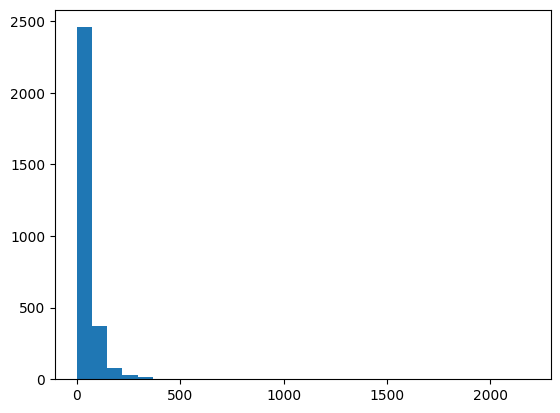

In [7]:
# cellIDbyCellLine_pNamesUnique,pcounts=np.unique(cellIDbyCellLine_pNames,return_counts=True)

cellIDbyCellLine_pNamesUniqueComb,pcounts=np.unique(np.concatenate((cellIDbyCellLine_pNames,cellIDbyCellLine_new_pNames)),return_counts=True)
plt.hist(pcounts,bins=30)

In [8]:
pcounts_min=150
cellIDbyCellLine_pNamesUniqueFiltered=cellIDbyCellLine_pNamesUniqueComb[pcounts>pcounts_min]
cellIDbyCellLine_pNames_filterIdx=np.repeat(False,cellIDbyCellLine_pNames.size)
for pcurr in cellIDbyCellLine_pNamesUniqueFiltered:
    cellIDbyCellLine_pNames_filterIdx[cellIDbyCellLine_pNames==pcurr]=True
cellIDbyCellLine_pNamesFiltered=cellIDbyCellLine_pNames[cellIDbyCellLine_pNames_filterIdx]
cellIDbyCellLine_Filtered=cellIDbyCellLine[cellIDbyCellLine_pNames_filterIdx]
cellIDbyCellLine_Filtered.shape

(36150,)

(array([2.457e+03, 3.720e+02, 8.100e+01, 3.100e+01, 1.400e+01, 5.000e+00,
        3.000e+00, 3.000e+00, 3.000e+00, 2.000e+00, 0.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([   3. ,   75.7,  148.4,  221.1,  293.8,  366.5,  439.2,  511.9,
         584.6,  657.3,  730. ,  802.7,  875.4,  948.1, 1020.8, 1093.5,
        1166.2, 1238.9, 1311.6, 1384.3, 1457. , 1529.7, 1602.4, 1675.1,
        1747.8, 1820.5, 1893.2, 1965.9, 2038.6, 2111.3, 2184. ]),
 <BarContainer object of 30 artists>)

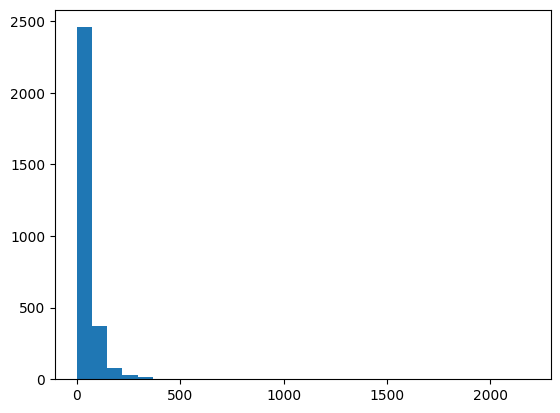

In [9]:
cellIDbyCellLine_new_pNamesUnique,pcounts_new=np.unique(cellIDbyCellLine_new_pNames,return_counts=True)
plt.hist(pcounts,bins=30)

In [10]:
# pcounts_min_new=100
# cellIDbyCellLine_new_pNamesUniqueFiltered=cellIDbyCellLine_new_pNamesUnique[pcounts_new>pcounts_min_new]
cellIDbyCellLine_pNames_new_filterIdx=np.repeat(False,cellIDbyCellLine_new_pNames.size)
for pcurr in cellIDbyCellLine_pNamesUniqueFiltered:
    cellIDbyCellLine_pNames_new_filterIdx[cellIDbyCellLine_new_pNames==pcurr]=True
cellIDbyCellLine_new_pNamesFiltered=cellIDbyCellLine_new_pNames[cellIDbyCellLine_pNames_new_filterIdx]
cellIDbyCellLine_new_Filtered=cellIDbyCellLine_new[cellIDbyCellLine_pNames_new_filterIdx]
cellIDbyCellLine_new_Filtered.shape

(1524,)

In [14]:
#get images
nsamples_all=cellIDbyCellLine_Filtered.size+cellIDbyCellLine_new_Filtered.size
allImages=np.zeros((nsamples_all,3,128,128))
allPnames=np.concatenate((cellIDbyCellLine_pNamesFiltered,cellIDbyCellLine_new_pNamesFiltered))
for i in range(cellIDbyCellLine_Filtered.size):
    if i%500==0:
        print(i)
    allImages[i]=get_data(cellIDbyCellLine_Filtered[i],Retrieval_Data.CELL_IMAGE)
for i in range(cellIDbyCellLine_new_Filtered.size):
    allImages[i+cellIDbyCellLine_Filtered.size]=get_data_new(cellIDbyCellLine_new_Filtered[i],Retrieval_Data.CELL_IMAGE)
    

In [70]:
#get protein images
allProteinImages=np.zeros((nsamples_all,128,128))
for i in range(cellIDbyCellLine_Filtered.size):
    if i%500==0:
        print(i)
    allProteinImages[i]=get_data(cellIDbyCellLine_Filtered[i],Retrieval_Data.TRUE_LABELS)[1]
for i in range(cellIDbyCellLine_new_Filtered.size):
    allProteinImages[i+cellIDbyCellLine_Filtered.size]=get_data_new(cellIDbyCellLine_new_Filtered[i],Retrieval_Data.TRUE_LABELS)[1]
    

0
500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000
10500
11000
11500
12000
12500
13000
13500
14000
14500
15000
15500
16000
16500
17000
17500
18000
18500
19000
19500
20000
20500
21000
21500
22000
22500
23000
23500
24000
24500
25000
25500
26000
26500
27000
27500
28000
28500
29000
29500
30000
30500
31000
31500
32000
32500
33000
33500
34000
34500
35000
35500
36000


### train

In [15]:
sharedSizes=[512]
dSpecific_filter=[(100,16)]
pID_type='randInit'
seed=3
c=0
p=2

In [16]:
#train-test split
np.random.seed(3)
pctVal=0.05
pctTest=0.1

allIdx_all=np.arange(nsamples_all)
np.random.shuffle(allIdx_all)
valIdx_all=allIdx_all[:int(pctVal*nsamples_all)]
testIdx_all=allIdx_all[int(pctVal*nsamples_all):(int(pctVal*nsamples_all)+int(pctTest*nsamples_all))]
trainIdx_all=allIdx_all[(int(pctVal*nsamples_all)+int(pctTest*nsamples_all)):]



In [17]:
os.environ["CUDA_VISIBLE_DEVICES"] = "2"
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

#VAE settings
epochs=4250
saveFreq=850
lr_latent=0.001 #initial learning rate
lr_decoder=0.0001
weight_decay=0 #Weight for L2 loss on embedding matrix.

# batchsize=4
batchsize=256
kernel_size=4
stride=2
padding=1

hidden1=64 
hidden2=128 
hidden3=256
hidden4=256
hidden5=96
hidden5_xy=4
fc_dim1=96*hidden5_xy*hidden5_xy

dropout=0.01




In [18]:
printFreq=1
trainIdx=trainIdx_all
imgsC_all=allImages[:,[c]]
imgsP_all=allImages[:,[p]]
def train(epoch):
    t = time.time()
    modelcnn_dna.train()
    modelcnn_protein.train()

    loss_x_train_all_dna=0
    loss_x_train_all_protein=0
    loss_lNorm_all=0
    loss_lNorm_all_dna=0
    loss_lNorm_all_protein=0
    loss_all=0
    ntrainBatches=int(np.ceil(trainIdx.shape[0]/batchsize))
    for i in range(ntrainBatches):
#         if i%200==0:
#         print(i)
        trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
        traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
        traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
        trainIdx_i=torch.tensor(trainIdx_i)
        trainInput_shared=latent_shared(trainIdx_i).cuda().float()
        trainInput_dna=latent_dna(trainIdx_i).cuda().float()
        trainInput_protein=latent_protein(trainIdx_i).cuda().float()
        if addNoise:
            trainInput_shared=trainInput_shared+torch.randn_like(trainInput_shared)
            trainInput_dna=trainInput_dna+torch.randn_like(trainInput_dna)
            trainInput_protein=trainInput_protein+torch.randn_like(trainInput_protein)
#         print(trainInput.shape)

        optimizer_dna.zero_grad()
        optimizer_protein.zero_grad()
        optimizer_latent.zero_grad()

        recon_dna= modelcnn_dna(torch.cat((trainInput_shared,trainInput_dna),dim=1))
        recon_protein= modelcnn_protein(torch.cat((trainInput_shared,trainInput_protein),dim=1))
        
        loss_x_train_protein=loss_x(recon_protein, traintarget_protein)
        loss_x_train_dna=loss_x(recon_dna, traintarget_dna)
        
        loss=loss_x_train_protein+loss_x_train_dna
        if addNoise:
            loss_lNorm=torch.mean(torch.linalg.norm(latent_shared(trainIdx_i).cuda(),dim=1))/latent_shared.embedding_dim
            loss_lNorm_all+=loss_lNorm.item()
            loss+=loss_lNorm*actDecay
            
            loss_lNorm_dna=torch.mean(torch.linalg.norm(latent_dna(trainIdx_i).cuda(),dim=1))/latent_dna.embedding_dim
            loss_lNorm_all_dna+=loss_lNorm_dna.item()
            loss+=loss_lNorm_dna*actDecay
            
            loss_lNorm_protein=torch.mean(torch.linalg.norm(latent_protein(trainIdx_i).cuda(),dim=1))/latent_protein.embedding_dim
            loss_lNorm_all_protein+=loss_lNorm_protein.item()
            loss+=loss_lNorm_protein*actDecay
        
        loss_x_train_all_dna+=loss_x_train_dna.item()
        loss_x_train_all_protein+=loss_x_train_protein.item()
        loss_all+=loss.item()
        
        loss.backward()
        optimizer_dna.step()
        optimizer_protein.step()
        optimizer_latent.step()


    loss_x_train_all_dna=loss_x_train_all_dna/ntrainBatches
    loss_x_train_all_protein=loss_x_train_all_protein/ntrainBatches
    loss_all=loss_all/ntrainBatches
    if addNoise:
        loss_lNorm_all=loss_lNorm_all/ntrainBatches
        loss_lNorm_all_dna=loss_lNorm_all_dna/ntrainBatches
        loss_lNorm_all_protein=loss_lNorm_all_protein/ntrainBatches




    if epoch%printFreq==0:
        print('Epoch: {:04d}'.format(epoch),
              'loss_train: {:.4f}'.format(loss_all),
              'loss_x_train_dna: {:.4f}'.format(loss_x_train_all_dna),
              'loss_x_train_protein: {:.4f}'.format(loss_x_train_all_protein),
              'time: {:.4f}s'.format(time.time() - t))
    return loss_all,loss_x_train_all_dna,loss_x_train_all_protein,loss_lNorm_all,loss_lNorm_all_dna,loss_lNorm_all_protein

In [19]:
match_weight=1
sharedWeight=1
addNoise=True
actDecay=0.001
name_train='nuc_er_noSharedRecon_all'
modelname_train='hpa_lord'
logsavepath_train=os.path.join('/mnt/d2/xinyi/c2p/hpa/log/',modelname_train,name_train)
modelsavepath_train=os.path.join('/mnt/d2/xinyi/c2p/hpa/models/',modelname_train,name_train)
plotsavepath_train=os.path.join('/mnt/d2/xinyi/c2p/hpa/plots/',modelname_train,name_train)

if not os.path.exists(os.path.join('/mnt/d2/xinyi/c2p/hpa/log/',modelname_train)):
    os.mkdir(os.path.join('/mnt/d2/xinyi/c2p/hpa/log/',modelname_train))
    os.mkdir(os.path.join('/mnt/d2/xinyi/c2p/hpa/models/',modelname_train))
    os.mkdir(os.path.join('/mnt/d2/xinyi/c2p/hpa/plots/',modelname_train))
if not os.path.exists(logsavepath_train):
    os.mkdir(logsavepath_train)
    os.mkdir(os.path.join(logsavepath_train,'dna'))
    os.mkdir(os.path.join(logsavepath_train,'protein'))
if not os.path.exists(modelsavepath_train):
    os.mkdir(modelsavepath_train)
    os.mkdir(os.path.join(modelsavepath_train,'dna'))
    os.mkdir(os.path.join(modelsavepath_train,'protein'))
if not os.path.exists(plotsavepath_train):
    os.mkdir(plotsavepath_train)
    os.mkdir(os.path.join(plotsavepath_train,'dna'))
    os.mkdir(os.path.join(plotsavepath_train,'protein'))




Epoch: 0850 loss_train: 0.3391 loss_x_train_dna: 0.1312 loss_x_train_protein: 0.2075 time: 26.9803s
Epoch: 0851 loss_train: 0.3391 loss_x_train_dna: 0.1312 loss_x_train_protein: 0.2075 time: 21.1529s
Epoch: 0852 loss_train: 0.3390 loss_x_train_dna: 0.1312 loss_x_train_protein: 0.2075 time: 30.1018s
Epoch: 0853 loss_train: 0.3391 loss_x_train_dna: 0.1312 loss_x_train_protein: 0.2075 time: 34.3807s
Epoch: 0854 loss_train: 0.3390 loss_x_train_dna: 0.1311 loss_x_train_protein: 0.2075 time: 33.2534s
Epoch: 0855 loss_train: 0.3391 loss_x_train_dna: 0.1311 loss_x_train_protein: 0.2075 time: 33.8124s
Epoch: 0856 loss_train: 0.3392 loss_x_train_dna: 0.1311 loss_x_train_protein: 0.2077 time: 33.4016s
Epoch: 0857 loss_train: 0.3391 loss_x_train_dna: 0.1311 loss_x_train_protein: 0.2076 time: 34.2314s
Epoch: 0858 loss_train: 0.3390 loss_x_train_dna: 0.1311 loss_x_train_protein: 0.2075 time: 33.5367s
Epoch: 0859 loss_train: 0.3389 loss_x_train_dna: 0.1311 loss_x_train_protein: 0.2074 time: 34.1391s


Epoch: 0932 loss_train: 0.3380 loss_x_train_dna: 0.1310 loss_x_train_protein: 0.2065 time: 32.9486s
Epoch: 0933 loss_train: 0.3380 loss_x_train_dna: 0.1310 loss_x_train_protein: 0.2065 time: 34.5742s
Epoch: 0934 loss_train: 0.3380 loss_x_train_dna: 0.1310 loss_x_train_protein: 0.2065 time: 34.1306s
Epoch: 0935 loss_train: 0.3379 loss_x_train_dna: 0.1310 loss_x_train_protein: 0.2065 time: 34.2798s
Epoch: 0936 loss_train: 0.3379 loss_x_train_dna: 0.1310 loss_x_train_protein: 0.2064 time: 33.2951s
Epoch: 0937 loss_train: 0.3378 loss_x_train_dna: 0.1310 loss_x_train_protein: 0.2064 time: 34.1735s
Epoch: 0938 loss_train: 0.3378 loss_x_train_dna: 0.1310 loss_x_train_protein: 0.2064 time: 33.3049s
Epoch: 0939 loss_train: 0.3378 loss_x_train_dna: 0.1309 loss_x_train_protein: 0.2064 time: 33.9251s
Epoch: 0940 loss_train: 0.3377 loss_x_train_dna: 0.1309 loss_x_train_protein: 0.2064 time: 33.2872s
Epoch: 0941 loss_train: 0.3377 loss_x_train_dna: 0.1309 loss_x_train_protein: 0.2064 time: 33.6208s


Epoch: 1014 loss_train: 0.3366 loss_x_train_dna: 0.1305 loss_x_train_protein: 0.2057 time: 33.1713s
Epoch: 1015 loss_train: 0.3366 loss_x_train_dna: 0.1305 loss_x_train_protein: 0.2057 time: 33.2776s
Epoch: 1016 loss_train: 0.3365 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2056 time: 33.6267s
Epoch: 1017 loss_train: 0.3364 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2056 time: 33.6857s
Epoch: 1018 loss_train: 0.3364 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2055 time: 33.1705s
Epoch: 1019 loss_train: 0.3364 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2055 time: 33.6098s
Epoch: 1020 loss_train: 0.3363 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2055 time: 33.8194s
Epoch: 1021 loss_train: 0.3363 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2055 time: 33.7811s
Epoch: 1022 loss_train: 0.3363 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2054 time: 33.0294s
Epoch: 1023 loss_train: 0.3363 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2055 time: 33.7748s


Epoch: 1096 loss_train: 0.3357 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2048 time: 34.2265s
Epoch: 1097 loss_train: 0.3357 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2048 time: 34.1841s
Epoch: 1098 loss_train: 0.3357 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2048 time: 33.6672s
Epoch: 1099 loss_train: 0.3357 loss_x_train_dna: 0.1304 loss_x_train_protein: 0.2048 time: 34.6299s
Epoch: 1100 loss_train: 0.3356 loss_x_train_dna: 0.1303 loss_x_train_protein: 0.2048 time: 36.0833s
Epoch: 1101 loss_train: 0.3356 loss_x_train_dna: 0.1303 loss_x_train_protein: 0.2048 time: 33.5012s
Epoch: 1102 loss_train: 0.3356 loss_x_train_dna: 0.1303 loss_x_train_protein: 0.2048 time: 33.6694s
Epoch: 1103 loss_train: 0.3355 loss_x_train_dna: 0.1303 loss_x_train_protein: 0.2048 time: 33.1775s
Epoch: 1104 loss_train: 0.3355 loss_x_train_dna: 0.1303 loss_x_train_protein: 0.2048 time: 34.6205s
Epoch: 1105 loss_train: 0.3355 loss_x_train_dna: 0.1303 loss_x_train_protein: 0.2048 time: 33.3006s


Epoch: 1178 loss_train: 0.3347 loss_x_train_dna: 0.1300 loss_x_train_protein: 0.2043 time: 34.4391s
Epoch: 1179 loss_train: 0.3347 loss_x_train_dna: 0.1300 loss_x_train_protein: 0.2043 time: 33.9138s
Epoch: 1180 loss_train: 0.3347 loss_x_train_dna: 0.1300 loss_x_train_protein: 0.2043 time: 34.2669s
Epoch: 1181 loss_train: 0.3347 loss_x_train_dna: 0.1300 loss_x_train_protein: 0.2043 time: 33.0444s
Epoch: 1182 loss_train: 0.3347 loss_x_train_dna: 0.1300 loss_x_train_protein: 0.2043 time: 33.5686s
Epoch: 1183 loss_train: 0.3347 loss_x_train_dna: 0.1299 loss_x_train_protein: 0.2042 time: 34.5068s
Epoch: 1184 loss_train: 0.3346 loss_x_train_dna: 0.1300 loss_x_train_protein: 0.2042 time: 31.9559s
Epoch: 1185 loss_train: 0.3347 loss_x_train_dna: 0.1300 loss_x_train_protein: 0.2042 time: 32.8844s
Epoch: 1186 loss_train: 0.3347 loss_x_train_dna: 0.1299 loss_x_train_protein: 0.2042 time: 33.5257s
Epoch: 1187 loss_train: 0.3347 loss_x_train_dna: 0.1299 loss_x_train_protein: 0.2042 time: 32.6681s


Epoch: 1260 loss_train: 0.3340 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2037 time: 30.7234s
Epoch: 1261 loss_train: 0.3340 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2037 time: 34.2977s
Epoch: 1262 loss_train: 0.3340 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2037 time: 32.9103s
Epoch: 1263 loss_train: 0.3340 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2037 time: 32.8980s
Epoch: 1264 loss_train: 0.3341 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2038 time: 33.2105s
Epoch: 1265 loss_train: 0.3341 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2038 time: 31.9150s
Epoch: 1266 loss_train: 0.3342 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2039 time: 32.8654s
Epoch: 1267 loss_train: 0.3341 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2038 time: 32.5641s
Epoch: 1268 loss_train: 0.3341 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2038 time: 33.0349s
Epoch: 1269 loss_train: 0.3340 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2037 time: 33.3805s


Epoch: 1344 loss_train: 0.3334 loss_x_train_dna: 0.1297 loss_x_train_protein: 0.2032 time: 32.6934s
Epoch: 1345 loss_train: 0.3334 loss_x_train_dna: 0.1297 loss_x_train_protein: 0.2032 time: 33.1954s
Epoch: 1346 loss_train: 0.3334 loss_x_train_dna: 0.1297 loss_x_train_protein: 0.2032 time: 33.0088s
Epoch: 1347 loss_train: 0.3334 loss_x_train_dna: 0.1297 loss_x_train_protein: 0.2032 time: 33.4902s
Epoch: 1348 loss_train: 0.3334 loss_x_train_dna: 0.1297 loss_x_train_protein: 0.2032 time: 33.3571s
Epoch: 1349 loss_train: 0.3334 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2031 time: 31.9638s
Epoch: 1350 loss_train: 0.3334 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2031 time: 32.7915s
Epoch: 1351 loss_train: 0.3334 loss_x_train_dna: 0.1298 loss_x_train_protein: 0.2031 time: 31.6649s
Epoch: 1352 loss_train: 0.3335 loss_x_train_dna: 0.1299 loss_x_train_protein: 0.2031 time: 32.6084s
Epoch: 1353 loss_train: 0.3335 loss_x_train_dna: 0.1299 loss_x_train_protein: 0.2031 time: 32.8830s


Epoch: 1426 loss_train: 0.3327 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2027 time: 32.3637s
Epoch: 1427 loss_train: 0.3327 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2027 time: 33.3516s
Epoch: 1428 loss_train: 0.3327 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2026 time: 33.0462s
Epoch: 1429 loss_train: 0.3327 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2026 time: 33.1089s
Epoch: 1430 loss_train: 0.3327 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2026 time: 32.6629s
Epoch: 1431 loss_train: 0.3327 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2026 time: 33.1806s
Epoch: 1432 loss_train: 0.3327 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2026 time: 33.5286s
Epoch: 1433 loss_train: 0.3326 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2026 time: 32.9027s
Epoch: 1434 loss_train: 0.3326 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2026 time: 33.0402s
Epoch: 1435 loss_train: 0.3326 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2026 time: 33.7722s


Epoch: 1508 loss_train: 0.3322 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2022 time: 32.3577s
Epoch: 1509 loss_train: 0.3322 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2022 time: 33.0006s
Epoch: 1510 loss_train: 0.3323 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2022 time: 32.8826s
Epoch: 1511 loss_train: 0.3323 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2022 time: 33.7476s
Epoch: 1512 loss_train: 0.3323 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2022 time: 32.9535s
Epoch: 1513 loss_train: 0.3323 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2022 time: 33.3308s
Epoch: 1514 loss_train: 0.3323 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2022 time: 32.3096s
Epoch: 1515 loss_train: 0.3323 loss_x_train_dna: 0.1296 loss_x_train_protein: 0.2022 time: 31.9934s
Epoch: 1516 loss_train: 0.3323 loss_x_train_dna: 0.1296 loss_x_train_protein: 0.2022 time: 33.2143s
Epoch: 1517 loss_train: 0.3324 loss_x_train_dna: 0.1296 loss_x_train_protein: 0.2022 time: 32.8871s


Epoch: 1590 loss_train: 0.3317 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2019 time: 32.6877s
Epoch: 1591 loss_train: 0.3318 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2019 time: 33.3559s
Epoch: 1592 loss_train: 0.3318 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2019 time: 33.4907s
Epoch: 1593 loss_train: 0.3317 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2019 time: 33.3610s
Epoch: 1594 loss_train: 0.3317 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2019 time: 32.3212s
Epoch: 1595 loss_train: 0.3318 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2019 time: 32.8936s
Epoch: 1596 loss_train: 0.3318 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2019 time: 33.5246s
Epoch: 1597 loss_train: 0.3317 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2019 time: 33.0108s
Epoch: 1598 loss_train: 0.3317 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2019 time: 33.9768s
Epoch: 1599 loss_train: 0.3317 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2018 time: 33.0681s


Epoch: 1672 loss_train: 0.3314 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2016 time: 33.3385s
Epoch: 1673 loss_train: 0.3314 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2015 time: 32.1685s
Epoch: 1674 loss_train: 0.3314 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2015 time: 33.6264s
Epoch: 1675 loss_train: 0.3314 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2015 time: 33.5693s
Epoch: 1676 loss_train: 0.3314 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2015 time: 33.1880s
Epoch: 1677 loss_train: 0.3313 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2015 time: 32.1947s
Epoch: 1678 loss_train: 0.3313 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2015 time: 32.1804s
Epoch: 1679 loss_train: 0.3313 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2015 time: 33.8379s
Epoch: 1680 loss_train: 0.3313 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2015 time: 32.9015s
Epoch: 1681 loss_train: 0.3313 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.2015 time: 32.6792s


Epoch: 1754 loss_train: 0.3312 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2012 time: 33.4003s
Epoch: 1755 loss_train: 0.3312 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2012 time: 34.2618s
Epoch: 1756 loss_train: 0.3312 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2012 time: 34.4683s
Epoch: 1757 loss_train: 0.3312 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2012 time: 34.3308s
Epoch: 1758 loss_train: 0.3312 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2012 time: 33.8629s
Epoch: 1759 loss_train: 0.3313 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2012 time: 33.4102s
Epoch: 1760 loss_train: 0.3313 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.2012 time: 33.2706s
Epoch: 1761 loss_train: 0.3313 loss_x_train_dna: 0.1296 loss_x_train_protein: 0.2012 time: 33.6781s
Epoch: 1762 loss_train: 0.3313 loss_x_train_dna: 0.1296 loss_x_train_protein: 0.2012 time: 33.4401s
Epoch: 1763 loss_train: 0.3314 loss_x_train_dna: 0.1296 loss_x_train_protein: 0.2012 time: 32.7311s


Epoch: 1836 loss_train: 0.3309 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2012 time: 21.2899s
Epoch: 1837 loss_train: 0.3310 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2013 time: 21.0988s
Epoch: 1838 loss_train: 0.3310 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2014 time: 20.6803s
Epoch: 1839 loss_train: 0.3311 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2014 time: 20.7265s
Epoch: 1840 loss_train: 0.3312 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2016 time: 20.4936s
Epoch: 1841 loss_train: 0.3313 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2016 time: 20.6673s
Epoch: 1842 loss_train: 0.3313 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2016 time: 20.6893s
Epoch: 1843 loss_train: 0.3313 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2016 time: 20.7186s
Epoch: 1844 loss_train: 0.3313 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2016 time: 21.2770s
Epoch: 1845 loss_train: 0.3312 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2015 time: 21.2951s


Epoch: 1918 loss_train: 0.3303 loss_x_train_dna: 0.1290 loss_x_train_protein: 0.2007 time: 21.3105s
Epoch: 1919 loss_train: 0.3302 loss_x_train_dna: 0.1290 loss_x_train_protein: 0.2006 time: 21.0123s
Epoch: 1923 loss_train: 0.3302 loss_x_train_dna: 0.1290 loss_x_train_protein: 0.2006 time: 21.1151s
Epoch: 1924 loss_train: 0.3302 loss_x_train_dna: 0.1290 loss_x_train_protein: 0.2006 time: 21.5922s
Epoch: 1925 loss_train: 0.3302 loss_x_train_dna: 0.1290 loss_x_train_protein: 0.2006 time: 20.8647s
Epoch: 1926 loss_train: 0.3302 loss_x_train_dna: 0.1290 loss_x_train_protein: 0.2006 time: 21.0320s
Epoch: 1927 loss_train: 0.3302 loss_x_train_dna: 0.1290 loss_x_train_protein: 0.2006 time: 21.0471s
Epoch: 1928 loss_train: 0.3302 loss_x_train_dna: 0.1290 loss_x_train_protein: 0.2006 time: 21.2585s
Epoch: 1929 loss_train: 0.3302 loss_x_train_dna: 0.1290 loss_x_train_protein: 0.2006 time: 20.9906s
Epoch: 1930 loss_train: 0.3302 loss_x_train_dna: 0.1290 loss_x_train_protein: 0.2006 time: 20.0396s


Epoch: 2003 loss_train: 0.3303 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2006 time: 19.7410s
Epoch: 2004 loss_train: 0.3303 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2006 time: 19.2972s
Epoch: 2005 loss_train: 0.3303 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2007 time: 19.7107s
Epoch: 2006 loss_train: 0.3304 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2007 time: 19.5251s
Epoch: 2007 loss_train: 0.3304 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2007 time: 19.2512s
Epoch: 2008 loss_train: 0.3304 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2008 time: 19.7992s
Epoch: 2009 loss_train: 0.3305 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2008 time: 19.6982s
Epoch: 2010 loss_train: 0.3306 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2009 time: 19.3090s
Epoch: 2011 loss_train: 0.3307 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2010 time: 19.7366s
Epoch: 2012 loss_train: 0.3308 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.2011 time: 19.8529s


Epoch: 2085 loss_train: 0.3297 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.6986s
Epoch: 2086 loss_train: 0.3297 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.7775s
Epoch: 2087 loss_train: 0.3297 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.5267s
Epoch: 2088 loss_train: 0.3297 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.3788s
Epoch: 2089 loss_train: 0.3297 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.6931s
Epoch: 2090 loss_train: 0.3297 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.2637s
Epoch: 2091 loss_train: 0.3297 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.5611s
Epoch: 2092 loss_train: 0.3296 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.6382s
Epoch: 2093 loss_train: 0.3296 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.2995s
Epoch: 2094 loss_train: 0.3296 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.2977s


Epoch: 2167 loss_train: 0.3297 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.3959s
Epoch: 2168 loss_train: 0.3296 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2002 time: 19.6830s
Epoch: 2169 loss_train: 0.3296 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2001 time: 19.6115s
Epoch: 2170 loss_train: 0.3295 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.2001 time: 19.2445s
Epoch: 2171 loss_train: 0.3296 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.2001 time: 19.5150s
Epoch: 2172 loss_train: 0.3296 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.2001 time: 18.7326s
Epoch: 2173 loss_train: 0.3295 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.2001 time: 19.6586s
Epoch: 2174 loss_train: 0.3295 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.2001 time: 19.6754s
Epoch: 2175 loss_train: 0.3295 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.2001 time: 19.5553s
Epoch: 2176 loss_train: 0.3295 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.2001 time: 19.5191s


Epoch: 2249 loss_train: 0.3293 loss_x_train_dna: 0.1290 loss_x_train_protein: 0.1997 time: 19.6044s
Epoch: 2250 loss_train: 0.3292 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.1997 time: 19.6356s
Epoch: 2251 loss_train: 0.3292 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.1997 time: 19.4984s
Epoch: 2252 loss_train: 0.3292 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.1997 time: 18.1005s
Epoch: 2253 loss_train: 0.3292 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.1998 time: 17.6960s
Epoch: 2254 loss_train: 0.3292 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1998 time: 18.3596s
Epoch: 2255 loss_train: 0.3292 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1997 time: 19.6249s
Epoch: 2256 loss_train: 0.3292 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1997 time: 19.7865s
Epoch: 2257 loss_train: 0.3291 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1997 time: 19.6138s
Epoch: 2258 loss_train: 0.3291 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1997 time: 19.6408s


Epoch: 2331 loss_train: 0.3289 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1995 time: 19.7501s
Epoch: 2332 loss_train: 0.3289 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1995 time: 19.7215s
Epoch: 2333 loss_train: 0.3289 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1996 time: 19.8179s
Epoch: 2334 loss_train: 0.3289 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1995 time: 19.6641s
Epoch: 2335 loss_train: 0.3289 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1995 time: 18.6565s
Epoch: 2336 loss_train: 0.3289 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1995 time: 18.4950s
Epoch: 2337 loss_train: 0.3289 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1995 time: 19.8737s
Epoch: 2338 loss_train: 0.3289 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1995 time: 19.7539s
Epoch: 2339 loss_train: 0.3289 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1995 time: 19.9237s
Epoch: 2340 loss_train: 0.3289 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1995 time: 19.8935s


Epoch: 2413 loss_train: 0.3287 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1993 time: 18.8511s
Epoch: 2414 loss_train: 0.3286 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1993 time: 19.8146s
Epoch: 2415 loss_train: 0.3286 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1993 time: 19.8681s
Epoch: 2416 loss_train: 0.3286 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1993 time: 19.6332s
Epoch: 2417 loss_train: 0.3286 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1993 time: 20.0779s
Epoch: 2418 loss_train: 0.3286 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1993 time: 20.1117s
Epoch: 2419 loss_train: 0.3286 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1993 time: 19.8772s
Epoch: 2420 loss_train: 0.3286 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1993 time: 19.9081s
Epoch: 2421 loss_train: 0.3286 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1993 time: 19.3805s
Epoch: 2422 loss_train: 0.3286 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1993 time: 20.0693s


Epoch: 2495 loss_train: 0.3285 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1992 time: 19.8424s
Epoch: 2496 loss_train: 0.3285 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1992 time: 19.6516s
Epoch: 2497 loss_train: 0.3284 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1992 time: 19.7169s
Epoch: 2498 loss_train: 0.3284 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1992 time: 19.8148s
Epoch: 2499 loss_train: 0.3284 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1992 time: 19.9272s
Epoch: 2500 loss_train: 0.3284 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1991 time: 19.6562s
Epoch: 2501 loss_train: 0.3284 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1991 time: 19.4499s
Epoch: 2502 loss_train: 0.3284 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1991 time: 19.3357s
Epoch: 2503 loss_train: 0.3284 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1991 time: 19.8531s
Epoch: 2504 loss_train: 0.3284 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1991 time: 20.1224s


Epoch: 2577 loss_train: 0.3282 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1990 time: 19.4775s
Epoch: 2578 loss_train: 0.3282 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1990 time: 19.6195s
Epoch: 2579 loss_train: 0.3282 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1990 time: 19.3334s
Epoch: 2580 loss_train: 0.3282 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1990 time: 19.4025s
Epoch: 2581 loss_train: 0.3282 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1989 time: 18.2280s
Epoch: 2582 loss_train: 0.3282 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1990 time: 19.0110s
Epoch: 2583 loss_train: 0.3282 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1990 time: 19.3967s
Epoch: 2584 loss_train: 0.3282 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1990 time: 19.8303s
Epoch: 2585 loss_train: 0.3282 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1990 time: 19.1670s
Epoch: 2586 loss_train: 0.3282 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1990 time: 19.6340s


Epoch: 2659 loss_train: 0.3281 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1989 time: 19.5421s
Epoch: 2660 loss_train: 0.3281 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1989 time: 19.7919s
Epoch: 2661 loss_train: 0.3281 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1989 time: 19.3451s
Epoch: 2662 loss_train: 0.3280 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1988 time: 19.5876s
Epoch: 2663 loss_train: 0.3280 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1988 time: 19.3201s
Epoch: 2664 loss_train: 0.3280 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1988 time: 19.9609s
Epoch: 2665 loss_train: 0.3280 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1988 time: 19.6915s
Epoch: 2666 loss_train: 0.3280 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1988 time: 19.2841s
Epoch: 2667 loss_train: 0.3280 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1988 time: 19.6939s
Epoch: 2668 loss_train: 0.3280 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1988 time: 19.2364s


Epoch: 2741 loss_train: 0.3281 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1987 time: 19.7651s
Epoch: 2742 loss_train: 0.3281 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1987 time: 19.6048s
Epoch: 2743 loss_train: 0.3281 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1987 time: 19.8485s
Epoch: 2744 loss_train: 0.3281 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1987 time: 19.6983s
Epoch: 2745 loss_train: 0.3281 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1987 time: 19.9896s
Epoch: 2746 loss_train: 0.3281 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1987 time: 19.8942s
Epoch: 2747 loss_train: 0.3281 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1987 time: 19.8739s
Epoch: 2748 loss_train: 0.3281 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1987 time: 19.9741s
Epoch: 2749 loss_train: 0.3281 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1986 time: 19.7546s
Epoch: 2750 loss_train: 0.3280 loss_x_train_dna: 0.1288 loss_x_train_protein: 0.1986 time: 19.8288s


Epoch: 2823 loss_train: 0.3282 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1990 time: 19.9857s
Epoch: 2824 loss_train: 0.3282 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1991 time: 19.8983s
Epoch: 2825 loss_train: 0.3283 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1991 time: 20.0412s
Epoch: 2826 loss_train: 0.3283 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1991 time: 20.0330s
Epoch: 2827 loss_train: 0.3282 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1991 time: 19.4487s
Epoch: 2828 loss_train: 0.3282 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1990 time: 19.9820s
Epoch: 2829 loss_train: 0.3281 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1990 time: 19.9281s
Epoch: 2830 loss_train: 0.3281 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1989 time: 19.9069s
Epoch: 2831 loss_train: 0.3280 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1989 time: 19.9734s
Epoch: 2832 loss_train: 0.3280 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1988 time: 19.7123s


Epoch: 2905 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1984 time: 19.1974s
Epoch: 2906 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1984 time: 19.7220s
Epoch: 2907 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1984 time: 20.1089s
Epoch: 2908 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1984 time: 20.0689s
Epoch: 2909 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1984 time: 19.8496s
Epoch: 2910 loss_train: 0.3274 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1983 time: 19.6140s
Epoch: 2911 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1983 time: 19.8819s
Epoch: 2912 loss_train: 0.3274 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1983 time: 19.4758s
Epoch: 2913 loss_train: 0.3274 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1983 time: 19.6796s
Epoch: 2914 loss_train: 0.3274 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1983 time: 19.9291s


Epoch: 2987 loss_train: 0.3276 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1985 time: 20.1053s
Epoch: 2988 loss_train: 0.3276 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1985 time: 19.9368s
Epoch: 2989 loss_train: 0.3276 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1985 time: 19.7035s
Epoch: 2990 loss_train: 0.3276 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1985 time: 19.8932s
Epoch: 2991 loss_train: 0.3276 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1985 time: 19.2334s
Epoch: 2992 loss_train: 0.3276 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1984 time: 18.4864s
Epoch: 2993 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1984 time: 19.8508s
Epoch: 2994 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1984 time: 19.9645s
Epoch: 2995 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1984 time: 19.9129s
Epoch: 2996 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1984 time: 20.1160s


Epoch: 3069 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1983 time: 19.9436s
Epoch: 3070 loss_train: 0.3275 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1984 time: 20.1605s
Epoch: 3071 loss_train: 0.3276 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1985 time: 19.8566s
Epoch: 3072 loss_train: 0.3278 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1986 time: 19.7825s
Epoch: 3073 loss_train: 0.3279 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1988 time: 19.8974s
Epoch: 3074 loss_train: 0.3279 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1988 time: 19.2503s
Epoch: 3075 loss_train: 0.3278 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1987 time: 19.9646s
Epoch: 3076 loss_train: 0.3278 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1986 time: 20.0835s
Epoch: 3077 loss_train: 0.3277 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1986 time: 19.7811s
Epoch: 3078 loss_train: 0.3277 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1986 time: 20.0842s


Epoch: 3151 loss_train: 0.3271 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1980 time: 20.0567s
Epoch: 3152 loss_train: 0.3271 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1980 time: 19.7784s
Epoch: 3153 loss_train: 0.3271 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1980 time: 19.7315s
Epoch: 3154 loss_train: 0.3271 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1980 time: 19.7795s
Epoch: 3155 loss_train: 0.3271 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1980 time: 19.8603s
Epoch: 3156 loss_train: 0.3271 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1980 time: 19.9068s
Epoch: 3157 loss_train: 0.3271 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1980 time: 19.4763s
Epoch: 3158 loss_train: 0.3271 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1980 time: 19.2926s
Epoch: 3159 loss_train: 0.3272 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1980 time: 19.5467s
Epoch: 3160 loss_train: 0.3272 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1980 time: 19.6465s


Epoch: 3233 loss_train: 0.3276 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.1980 time: 20.0429s
Epoch: 3234 loss_train: 0.3276 loss_x_train_dna: 0.1289 loss_x_train_protein: 0.1980 time: 19.7908s
Epoch: 3235 loss_train: 0.3278 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.1980 time: 19.5715s
Epoch: 3236 loss_train: 0.3279 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.1980 time: 19.5594s
Epoch: 3237 loss_train: 0.3279 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.1980 time: 19.4708s
Epoch: 3238 loss_train: 0.3279 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.1979 time: 19.9462s
Epoch: 3239 loss_train: 0.3282 loss_x_train_dna: 0.1296 loss_x_train_protein: 0.1979 time: 19.9627s
Epoch: 3240 loss_train: 0.3281 loss_x_train_dna: 0.1295 loss_x_train_protein: 0.1979 time: 19.7927s
Epoch: 3241 loss_train: 0.3278 loss_x_train_dna: 0.1293 loss_x_train_protein: 0.1979 time: 19.8735s
Epoch: 3242 loss_train: 0.3276 loss_x_train_dna: 0.1291 loss_x_train_protein: 0.1979 time: 20.1872s


Epoch: 3315 loss_train: 0.3274 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1981 time: 20.2190s
Epoch: 3316 loss_train: 0.3274 loss_x_train_dna: 0.1287 loss_x_train_protein: 0.1981 time: 19.8750s
Epoch: 3317 loss_train: 0.3274 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1981 time: 20.0286s
Epoch: 3318 loss_train: 0.3275 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1982 time: 19.9087s
Epoch: 3319 loss_train: 0.3275 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1983 time: 20.1048s
Epoch: 3320 loss_train: 0.3276 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1983 time: 19.8096s
Epoch: 3321 loss_train: 0.3275 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1982 time: 18.7273s
Epoch: 3322 loss_train: 0.3274 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1981 time: 19.4572s
Epoch: 3323 loss_train: 0.3273 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1981 time: 19.7905s
Epoch: 3324 loss_train: 0.3273 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1980 time: 19.8367s


Epoch: 3397 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 19.0710s
Epoch: 3398 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 19.8580s
Epoch: 3399 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 19.4439s
Epoch: 3400 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 18.7125s
Epoch: 3401 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 18.9644s
Epoch: 3402 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 19.2488s
Epoch: 3403 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 19.4973s
Epoch: 3404 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1977 time: 19.3293s
Epoch: 3405 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 19.2179s
Epoch: 3406 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1977 time: 19.5098s


Epoch: 3479 loss_train: 0.3265 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 19.4663s
Epoch: 3480 loss_train: 0.3265 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 19.3386s
Epoch: 3481 loss_train: 0.3265 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 19.7031s
Epoch: 3482 loss_train: 0.3265 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 18.6252s
Epoch: 3483 loss_train: 0.3265 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 18.9408s
Epoch: 3484 loss_train: 0.3265 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1976 time: 19.2118s
Epoch: 3485 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1977 time: 19.1337s
Epoch: 3486 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1977 time: 18.9599s
Epoch: 3487 loss_train: 0.3267 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1977 time: 19.1501s
Epoch: 3488 loss_train: 0.3266 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1977 time: 18.8873s


Epoch: 3561 loss_train: 0.3264 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1974 time: 19.5318s
Epoch: 3562 loss_train: 0.3264 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1974 time: 19.3766s
Epoch: 3563 loss_train: 0.3264 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1974 time: 19.4260s
Epoch: 3564 loss_train: 0.3264 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1975 time: 19.1829s
Epoch: 3565 loss_train: 0.3264 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1975 time: 19.4457s
Epoch: 3566 loss_train: 0.3264 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1974 time: 19.2824s
Epoch: 3567 loss_train: 0.3264 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1974 time: 19.0758s
Epoch: 3568 loss_train: 0.3264 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1974 time: 18.6862s
Epoch: 3569 loss_train: 0.3264 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1974 time: 19.7233s
Epoch: 3570 loss_train: 0.3264 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1974 time: 19.8506s


Epoch: 3643 loss_train: 0.3263 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1973 time: 19.3592s
Epoch: 3644 loss_train: 0.3263 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1973 time: 19.4079s
Epoch: 3645 loss_train: 0.3263 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1973 time: 19.7723s
Epoch: 3646 loss_train: 0.3263 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1973 time: 19.9120s
Epoch: 3647 loss_train: 0.3263 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1973 time: 19.5323s
Epoch: 3648 loss_train: 0.3263 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1973 time: 19.5770s
Epoch: 3649 loss_train: 0.3263 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1973 time: 19.5933s
Epoch: 3650 loss_train: 0.3263 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1973 time: 19.7955s
Epoch: 3651 loss_train: 0.3262 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1973 time: 19.4818s
Epoch: 3652 loss_train: 0.3262 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1973 time: 19.0545s


Epoch: 3725 loss_train: 0.3264 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1975 time: 19.0677s
Epoch: 3726 loss_train: 0.3264 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1975 time: 19.5690s
Epoch: 3727 loss_train: 0.3264 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1975 time: 19.3305s
Epoch: 3728 loss_train: 0.3264 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1975 time: 19.4052s
Epoch: 3729 loss_train: 0.3264 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1975 time: 19.4034s
Epoch: 3730 loss_train: 0.3264 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1975 time: 19.1752s
Epoch: 3731 loss_train: 0.3264 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1975 time: 19.2431s
Epoch: 3732 loss_train: 0.3264 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1975 time: 19.5246s
Epoch: 3733 loss_train: 0.3263 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1974 time: 19.6339s
Epoch: 3734 loss_train: 0.3263 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1974 time: 18.9770s


Epoch: 3807 loss_train: 0.3260 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1971 time: 19.5802s
Epoch: 3808 loss_train: 0.3260 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1971 time: 19.6760s
Epoch: 3809 loss_train: 0.3260 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1971 time: 19.7683s
Epoch: 3810 loss_train: 0.3260 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1971 time: 18.7291s
Epoch: 3811 loss_train: 0.3260 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1971 time: 18.9258s
Epoch: 3812 loss_train: 0.3260 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1971 time: 18.4990s
Epoch: 3813 loss_train: 0.3260 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1971 time: 19.2495s
Epoch: 3814 loss_train: 0.3260 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1971 time: 19.2968s
Epoch: 3815 loss_train: 0.3260 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1972 time: 19.1696s
Epoch: 3816 loss_train: 0.3260 loss_x_train_dna: 0.1282 loss_x_train_protein: 0.1971 time: 19.4748s


Epoch: 3889 loss_train: 0.3260 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1971 time: 19.6135s
Epoch: 3890 loss_train: 0.3260 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1971 time: 19.5371s
Epoch: 3891 loss_train: 0.3260 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1971 time: 19.5049s
Epoch: 3892 loss_train: 0.3261 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1970 time: 19.7860s
Epoch: 3893 loss_train: 0.3260 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1970 time: 19.4333s
Epoch: 3894 loss_train: 0.3260 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1970 time: 19.0312s
Epoch: 3895 loss_train: 0.3260 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1970 time: 19.2374s
Epoch: 3896 loss_train: 0.3261 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1971 time: 19.4970s
Epoch: 3897 loss_train: 0.3261 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1971 time: 19.4016s
Epoch: 3898 loss_train: 0.3261 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1971 time: 19.4122s


Epoch: 3971 loss_train: 0.3266 loss_x_train_dna: 0.1286 loss_x_train_protein: 0.1973 time: 19.4034s
Epoch: 3972 loss_train: 0.3265 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1973 time: 19.3946s
Epoch: 3973 loss_train: 0.3264 loss_x_train_dna: 0.1284 loss_x_train_protein: 0.1973 time: 19.6081s
Epoch: 3974 loss_train: 0.3263 loss_x_train_dna: 0.1284 loss_x_train_protein: 0.1972 time: 19.4836s
Epoch: 3975 loss_train: 0.3263 loss_x_train_dna: 0.1284 loss_x_train_protein: 0.1972 time: 19.8116s
Epoch: 3976 loss_train: 0.3262 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1972 time: 19.8271s
Epoch: 3977 loss_train: 0.3262 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1972 time: 18.8995s
Epoch: 3978 loss_train: 0.3262 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1971 time: 19.5738s
Epoch: 3979 loss_train: 0.3261 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1971 time: 19.4420s
Epoch: 3980 loss_train: 0.3261 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1971 time: 20.2963s


Epoch: 4053 loss_train: 0.3257 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1969 time: 19.7823s
Epoch: 4054 loss_train: 0.3257 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1969 time: 19.7467s
Epoch: 4055 loss_train: 0.3257 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1969 time: 19.6291s
Epoch: 4056 loss_train: 0.3257 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1969 time: 19.3373s
Epoch: 4057 loss_train: 0.3257 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1969 time: 19.5470s
Epoch: 4058 loss_train: 0.3258 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1969 time: 20.1010s
Epoch: 4059 loss_train: 0.3258 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1969 time: 19.8856s
Epoch: 4060 loss_train: 0.3257 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1969 time: 19.6302s
Epoch: 4061 loss_train: 0.3257 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1969 time: 19.7464s
Epoch: 4062 loss_train: 0.3257 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1969 time: 19.2066s


Epoch: 4135 loss_train: 0.3259 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1969 time: 19.3219s
Epoch: 4136 loss_train: 0.3260 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1969 time: 19.8245s
Epoch: 4137 loss_train: 0.3260 loss_x_train_dna: 0.1283 loss_x_train_protein: 0.1969 time: 19.4402s
Epoch: 4138 loss_train: 0.3260 loss_x_train_dna: 0.1284 loss_x_train_protein: 0.1969 time: 19.8049s
Epoch: 4139 loss_train: 0.3260 loss_x_train_dna: 0.1284 loss_x_train_protein: 0.1969 time: 19.6535s
Epoch: 4140 loss_train: 0.3261 loss_x_train_dna: 0.1284 loss_x_train_protein: 0.1969 time: 19.2566s
Epoch: 4141 loss_train: 0.3261 loss_x_train_dna: 0.1284 loss_x_train_protein: 0.1970 time: 20.0192s
Epoch: 4142 loss_train: 0.3261 loss_x_train_dna: 0.1284 loss_x_train_protein: 0.1970 time: 19.9910s
Epoch: 4143 loss_train: 0.3262 loss_x_train_dna: 0.1285 loss_x_train_protein: 0.1970 time: 19.7129s
Epoch: 4144 loss_train: 0.3262 loss_x_train_dna: 0.1284 loss_x_train_protein: 0.1970 time: 19.9115s


Epoch: 4217 loss_train: 0.3255 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1967 time: 19.8849s
Epoch: 4218 loss_train: 0.3255 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1967 time: 19.9115s
Epoch: 4219 loss_train: 0.3255 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1967 time: 19.8972s
Epoch: 4220 loss_train: 0.3255 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1967 time: 19.4882s
Epoch: 4221 loss_train: 0.3255 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1967 time: 20.1929s
Epoch: 4222 loss_train: 0.3255 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1967 time: 20.3346s
Epoch: 4223 loss_train: 0.3256 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1967 time: 19.6094s
Epoch: 4224 loss_train: 0.3256 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1967 time: 20.2253s
Epoch: 4225 loss_train: 0.3255 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1967 time: 20.2296s
Epoch: 4226 loss_train: 0.3255 loss_x_train_dna: 0.1281 loss_x_train_protein: 0.1967 time: 19.9880s


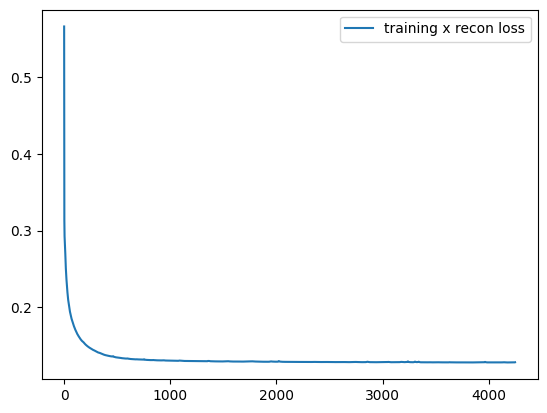

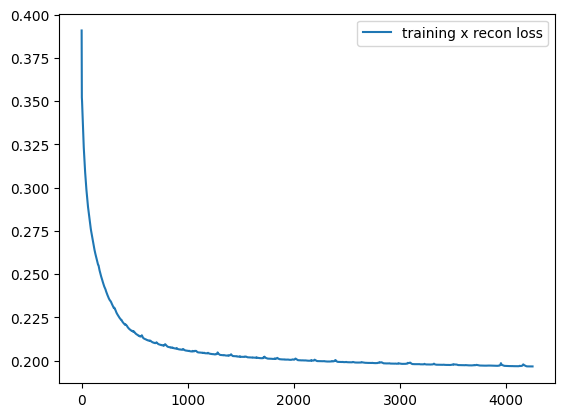

In [34]:

logsavepath_p_dna=os.path.join(logsavepath_train,'dna')
modelsavepath_p_dna=os.path.join(modelsavepath_train,'dna')
plotsavepath_p_dna=os.path.join(plotsavepath_train,'dna')
if not os.path.exists(logsavepath_p_dna):
    os.mkdir(logsavepath_p_dna)
if not os.path.exists(modelsavepath_p_dna):
    os.mkdir(modelsavepath_p_dna)
if not os.path.exists(plotsavepath_p_dna):
    os.mkdir(plotsavepath_p_dna)

logsavepath_p_protein=os.path.join(logsavepath_train,'protein')
modelsavepath_p_protein=os.path.join(modelsavepath_train,'protein')
plotsavepath_p_protein=os.path.join(plotsavepath_train,'protein')
if not os.path.exists(logsavepath_p_protein):
    os.mkdir(logsavepath_p_protein)
if not os.path.exists(modelsavepath_p_protein):
    os.mkdir(modelsavepath_p_protein)
if not os.path.exists(plotsavepath_p_protein):
    os.mkdir(plotsavepath_p_protein)



for currLatentSize in sharedSizes:
    for dSpecificSize,dfilterSize in dSpecific_filter:
        latent_curr=None


        print(currLatentSize)
        print(dSpecificSize)
        dna_cShared=hidden5-dfilterSize
        p_cShared=dna_cShared

        loss_x=torch.nn.BCEWithLogitsLoss()

        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.enabled = True
        if modelname_train=='hpa_lord':
            modelcnn_dna = model.model_cnnvae_conditional.CNN_VAE_decode(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,applySigmoid=False)
            modelcnn_protein = model.model_cnnvae_conditional.CNN_VAE_decode(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,applySigmoid=False)
        modelcnn_dna.cuda()
        modelcnn_protein.cuda()

        optimizer_dna = torch.optim.Adam(modelcnn_dna.parameters(), lr=lr_decoder, weight_decay=weight_decay)
        optimizer_protein = torch.optim.Adam(modelcnn_protein.parameters(), lr=lr_decoder, weight_decay=weight_decay)

        train_loss=[np.inf]*(epochs)
        train_loss_x_dna=[np.inf]*(epochs)
        train_loss_x_protein=[np.inf]*(epochs)
        
        train_lNorm=[np.inf]*(epochs)
        train_lNorm_dna=[np.inf]*(epochs)
        train_lNorm_protein=[np.inf]*(epochs)

        t_ep=time.time()

        stateDict_train_dna={}
        stateDict_train_protein={}
        
        latent_shared=torch.nn.Embedding(nsamples_all,currLatentSize)
        latent_protein=torch.nn.Embedding(nsamples_all,dSpecificSize)
        latent_dna=torch.nn.Embedding(nsamples_all,dSpecificSize)
        optimizer_latent= torch.optim.Adam([latent_shared.weight,latent_protein.weight,latent_dna.weight], lr=lr_latent, weight_decay=weight_decay)


for ep in range(epochs):
    train_loss[ep],train_loss_x_dna[ep],train_loss_x_protein[ep],train_lNorm[ep],train_lNorm_dna[ep],train_lNorm_protein[ep]=train(ep)


    if ep%saveFreq == (saveFreq-1):
        stateDict_train_dna[ep]=modelcnn_dna.cpu().state_dict()
        stateDict_train_protein[ep]=modelcnn_protein.cpu().state_dict()
        with open(os.path.join(modelsavepath_p_dna,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
            pickle.dump(latent_dna.weight, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(modelsavepath_p_dna,'latentShared_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
            pickle.dump(latent_shared.weight, output, pickle.HIGHEST_PROTOCOL)
        with open(os.path.join(modelsavepath_p_protein,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(ep)), 'wb') as output:
            pickle.dump(latent_protein.weight, output, pickle.HIGHEST_PROTOCOL)


    modelcnn_dna.cuda()
    modelcnn_protein.cuda()
    torch.cuda.empty_cache()
print(' total time: {:.4f}s'.format(time.time() - t_ep))

with open(os.path.join(modelsavepath_p_dna,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(stateDict_train_dna, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(modelsavepath_p_protein,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(stateDict_train_protein, output, pickle.HIGHEST_PROTOCOL)

with open(os.path.join(logsavepath_p_dna,'train_loss_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_loss, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_dna,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_loss_x_dna, output, pickle.HIGHEST_PROTOCOL)


with open(os.path.join(logsavepath_p_protein,'train_loss_x_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_loss_x_protein, output, pickle.HIGHEST_PROTOCOL)

with open(os.path.join(logsavepath_p_dna,'train_lNorm_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_lNorm, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_dna,'train_lNormDNA_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_lNorm_dna, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath_p_protein,'train_lNormProtein_'+str(currLatentSize)+'_'+str(seed)), 'wb') as output:
    pickle.dump(train_lNorm_protein, output, pickle.HIGHEST_PROTOCOL)


plt.plot(np.arange(epochs),train_loss_x_dna)
# plt.plot(np.arange(epochs),train_loss_kl_ep)
plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_dna,'loss_seed_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'.jpg'))
plt.show()


plt.plot(np.arange(epochs),train_loss_x_protein)
# plt.plot(np.arange(epochs),train_loss_kl_ep)
plt.legend(['training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
plt.savefig(os.path.join(plotsavepath_p_protein,'loss_seed_x'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'.jpg'))
plt.show()



In [20]:
loadEpoch='3399'
modelsavepath_p_dna=os.path.join(modelsavepath_train,'dna')
modelsavepath_p_protein=os.path.join(modelsavepath_train,'protein')
for currLatentSize in sharedSizes:
    for dSpecificSize,dfilterSize in dSpecific_filter:
        latent_curr=None
#         if sIdx==0:
#             continue


        print(currLatentSize)
        print(dSpecificSize)
        dna_cShared=hidden5-dfilterSize
        p_cShared=dna_cShared


        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.enabled = True
        if modelname_train=='hpa_lord':
            modelcnn_dna_dec = model.model_cnnvae_conditional.CNN_VAE_decode(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,applySigmoid=False)
            modelcnn_protein_dec = model.model_cnnvae_conditional.CNN_VAE_decode(kernel_size, stride, padding, 1, hidden1, hidden2, hidden3, hidden4, hidden5, fc_dim1,currLatentSize+dSpecificSize,applySigmoid=False)
        modelcnn_dna_dec.cuda().eval()
        modelcnn_protein_dec.cuda().eval()
        
        latent_shared_dec=torch.nn.Embedding(nsamples_all,currLatentSize)
        
        latent_protein_dec=torch.nn.Embedding(nsamples_all,dSpecificSize)
        latent_dna_dec=torch.nn.Embedding(nsamples_all,dSpecificSize)

        
        if loadEpoch is not None:
            with open(os.path.join(modelsavepath_p_dna,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(loadEpoch)), 'rb') as output:
                latent_dna_dec.weight=pickle.load(output)
            with open(os.path.join(modelsavepath_p_dna,'latentShared_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(loadEpoch)), 'rb') as output:
                latent_shared_dec.weight=pickle.load(output)
            with open(os.path.join(modelsavepath_p_protein,'latent_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)+'_'+str(loadEpoch)), 'rb') as output:
                latent_protein_dec.weight=pickle.load(output)
            
            with open(os.path.join(modelsavepath_p_dna,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'rb') as output:
                stateDict_train_dna_dec=pickle.load(output)
            with open(os.path.join(modelsavepath_p_protein,'stateDict_'+str(currLatentSize)+'_'+str(dSpecificSize)+'_'+str(seed)), 'rb') as output:
                stateDict_train_protein_dec=pickle.load(output)

            modelcnn_dna_dec.load_state_dict(stateDict_train_dna_dec[int(loadEpoch)])
            modelcnn_protein_dec.load_state_dict(stateDict_train_protein_dec[int(loadEpoch)])
        latent_shared_dec.weight.requires_grad=False
        
        latent_protein_dec.weight.requires_grad=False
        latent_dna_dec.weight.requires_grad=False


512
100


In [36]:
with torch.no_grad():
    i=0
    trainIdx_i=trainIdx[i*batchsize:min((i+1)*batchsize,trainIdx.shape[0])]
    traintarget_protein=torch.tensor(imgsP_all[trainIdx_i]).cuda().float()
    traintarget_dna=torch.tensor(imgsC_all[trainIdx_i]).cuda().float()
    trainIdx_i=torch.tensor(trainIdx_i)
    trainInput_shared=latent_shared_dec(trainIdx_i).cuda().float()
    trainInput_dna=latent_dna_dec(trainIdx_i).cuda().float()
    trainInput_protein=latent_protein_dec(trainIdx_i).cuda().float()

    recon_dna= modelcnn_dna_dec(torch.cat((trainInput_shared,trainInput_dna),dim=1))
    recon_protein= modelcnn_protein_dec(torch.cat((trainInput_shared,trainInput_protein),dim=1))


0


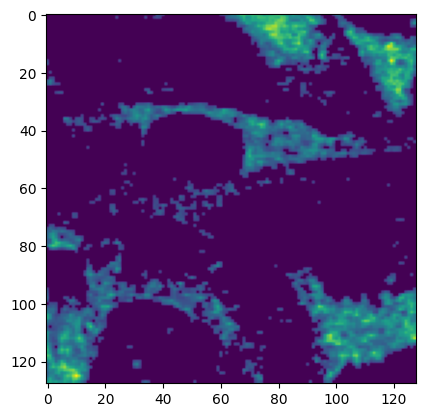

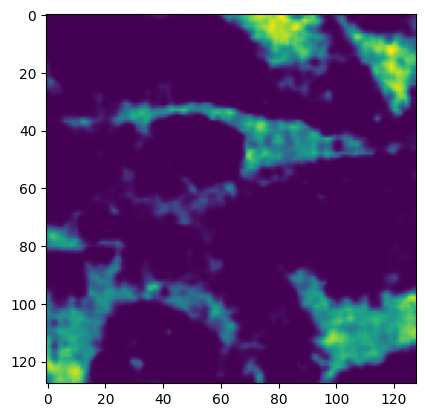

1


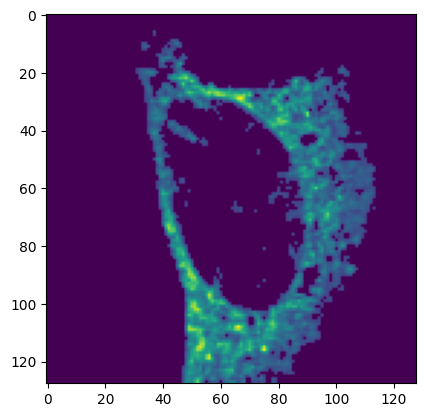

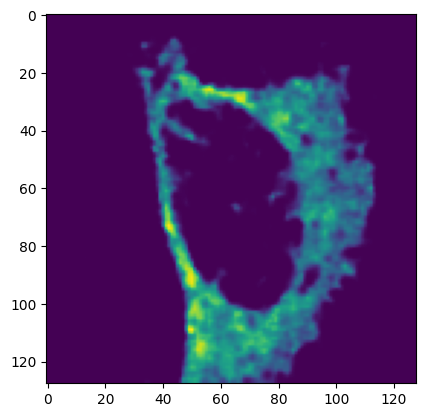

2


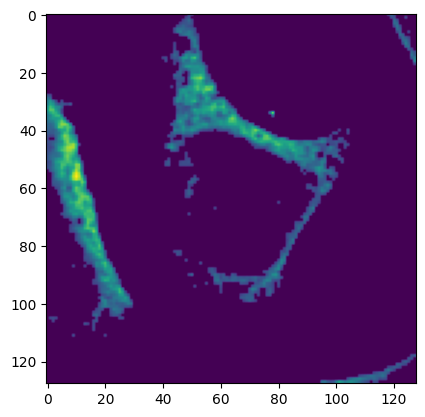

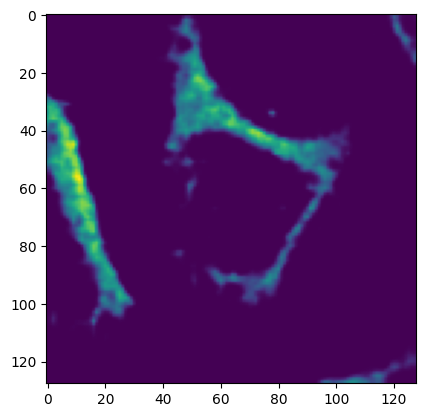

3


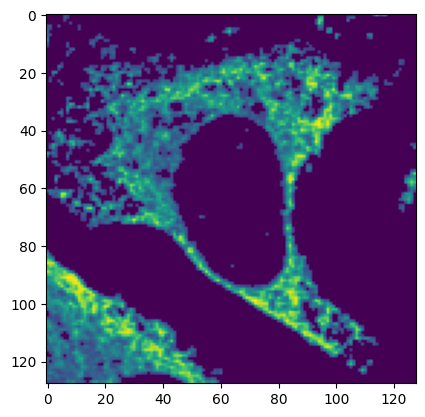

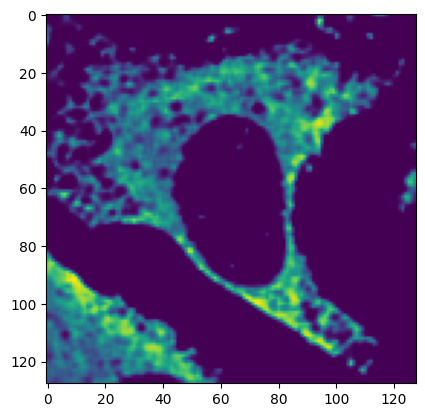

4


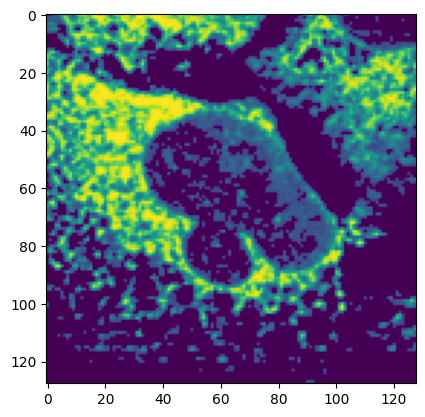

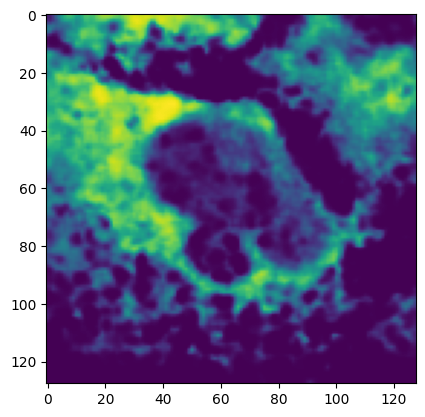

5


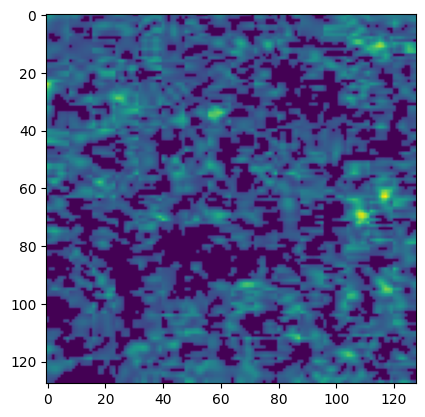

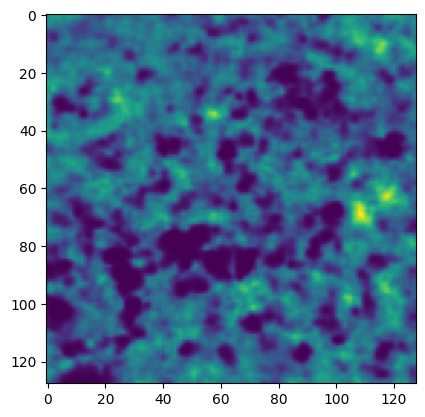

6


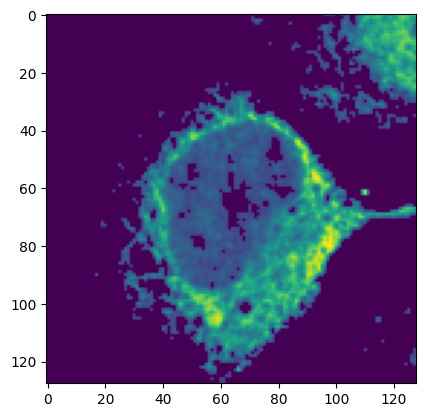

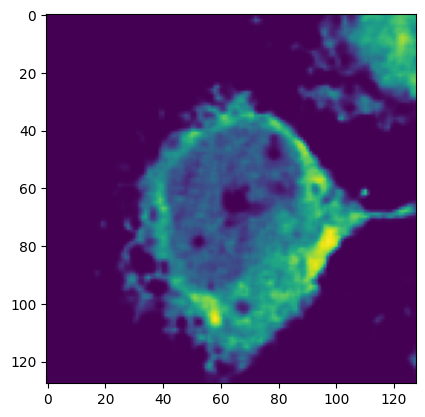

7


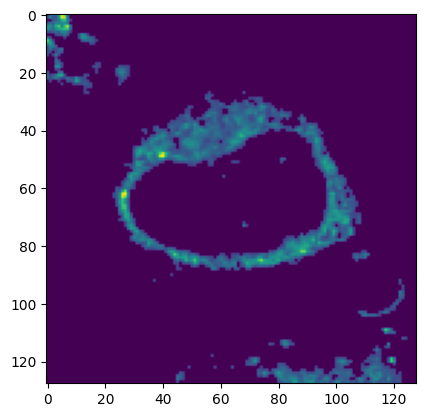

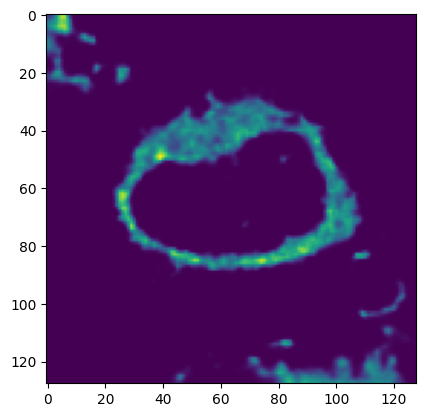

8


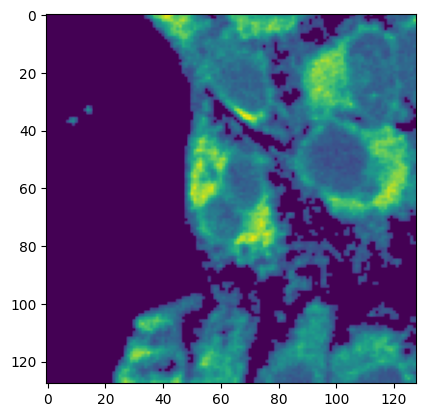

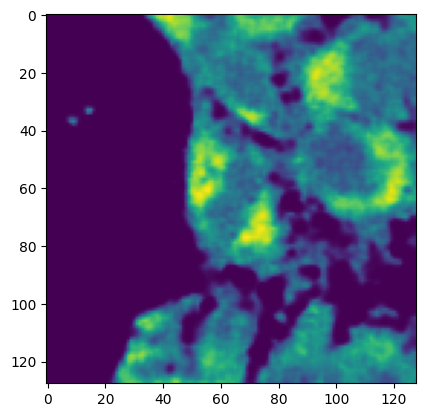

9


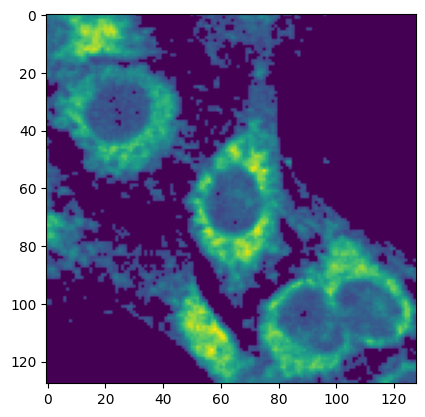

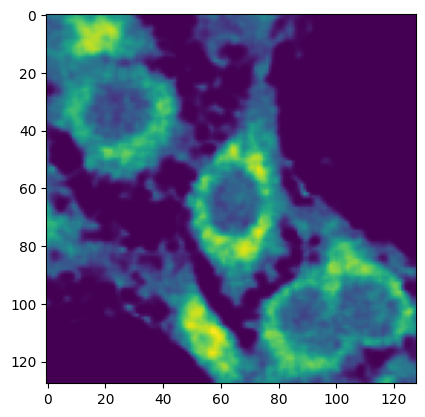

10


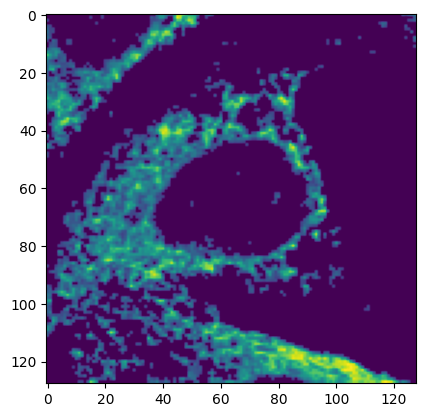

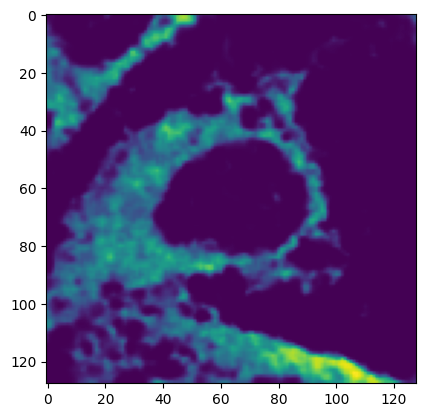

11


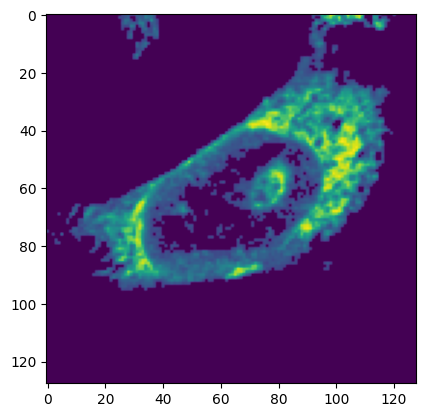

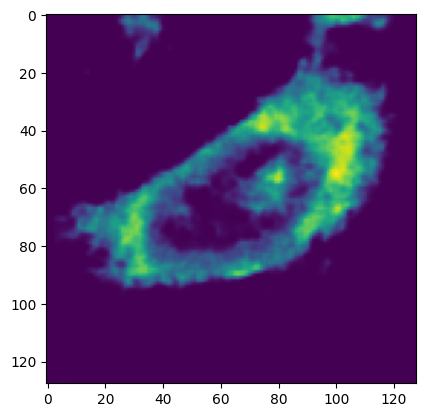

12


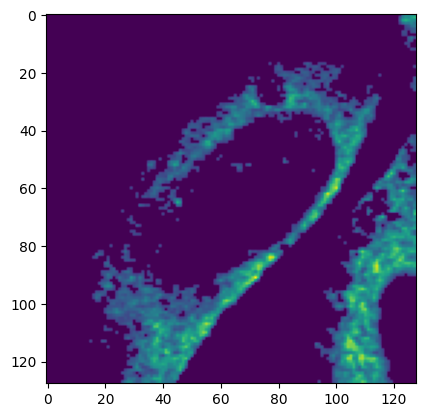

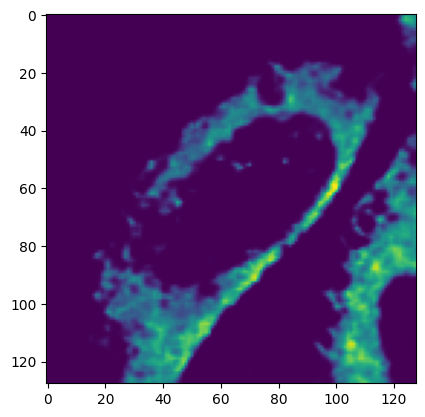

13


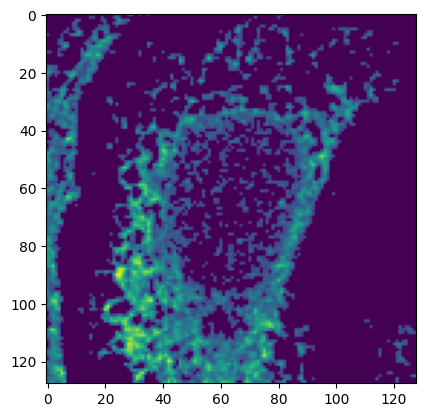

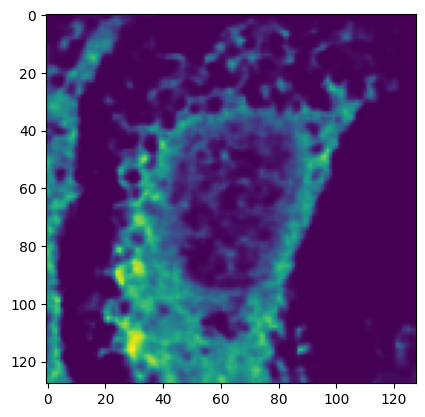

14


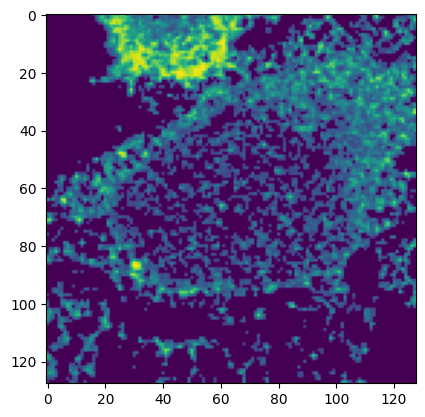

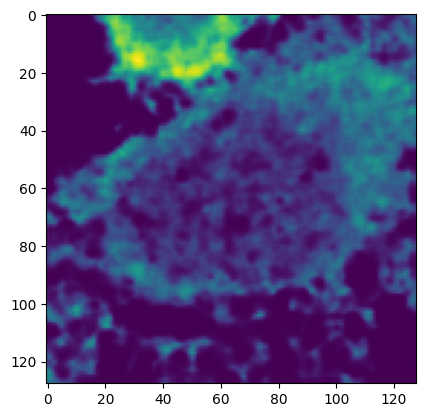

15


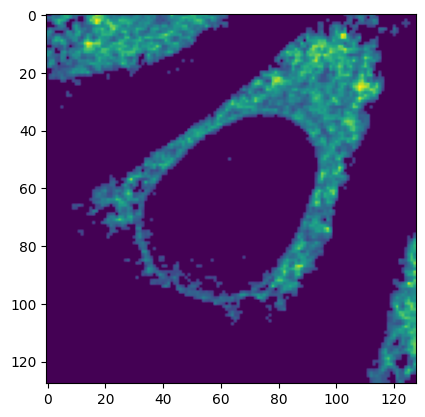

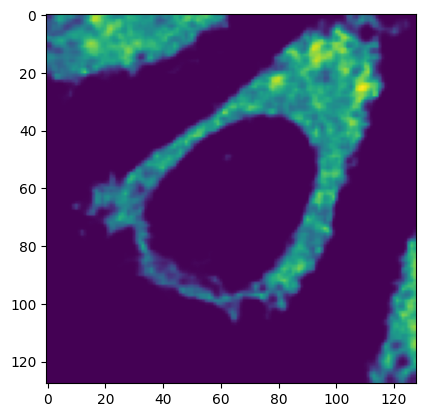

16


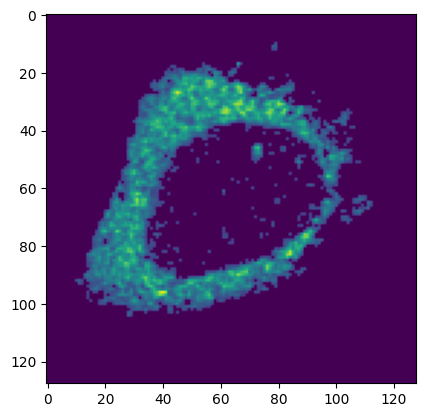

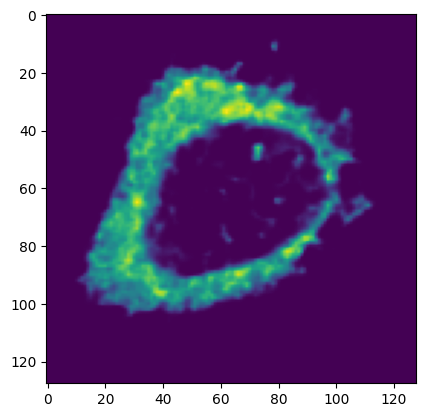

17


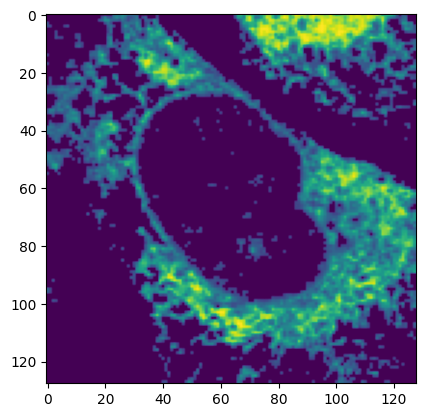

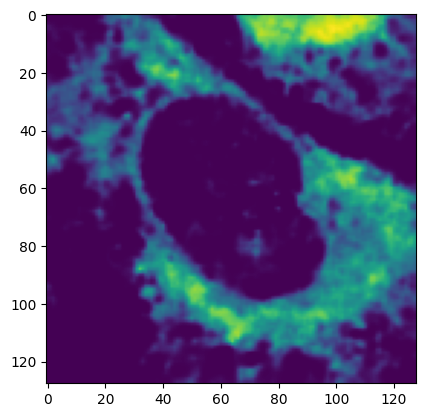

18


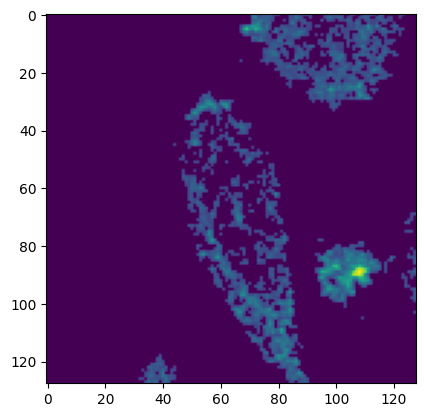

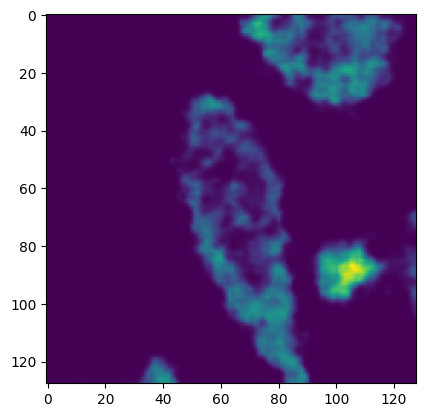

19


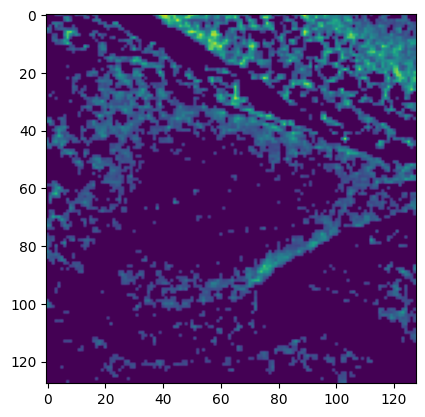

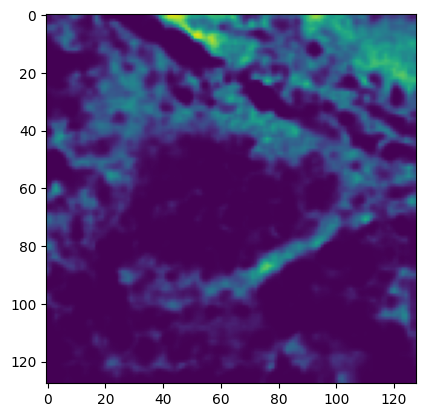

In [37]:
sigmoid=torch.nn.Sigmoid()
for i in range(20):
    print(i)
    plt.imshow(sigmoid(traintarget_protein[i][0]).cpu().detach().numpy())
    plt.show()
    plt.imshow(sigmoid(recon_protein[i][0]).cpu().detach().numpy())
    plt.show()

0


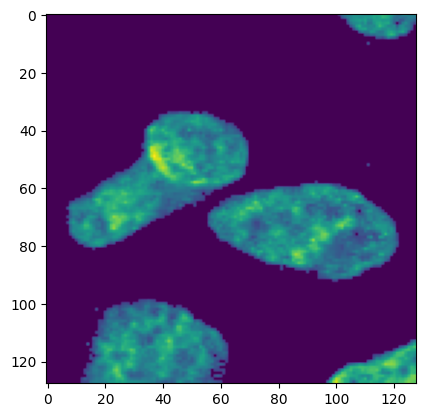

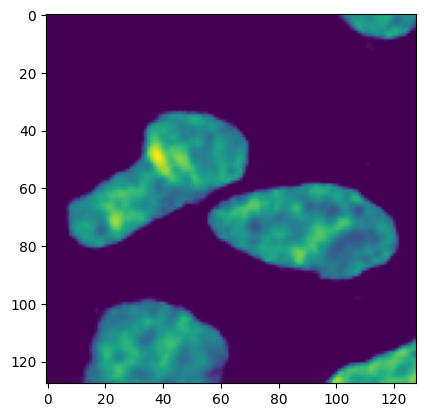

1


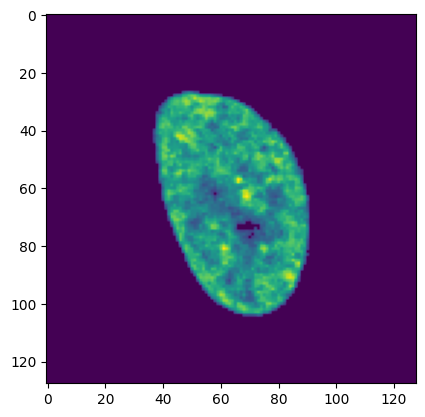

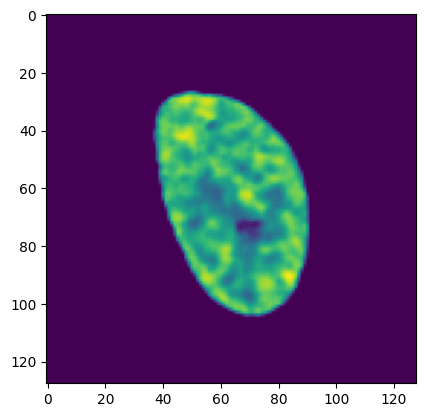

2


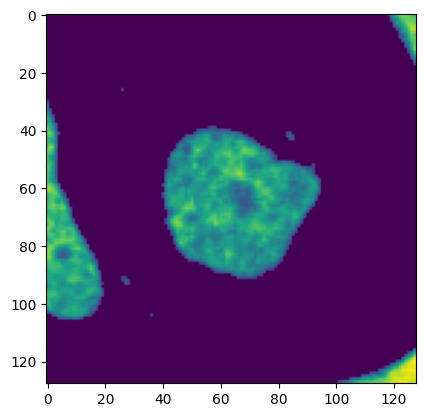

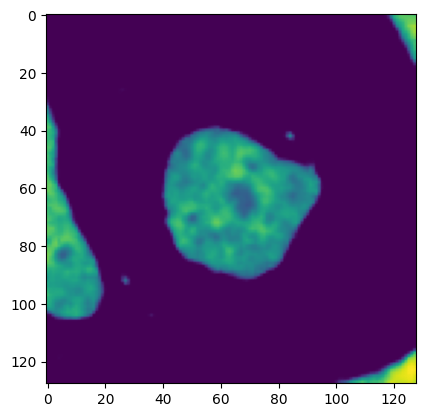

3


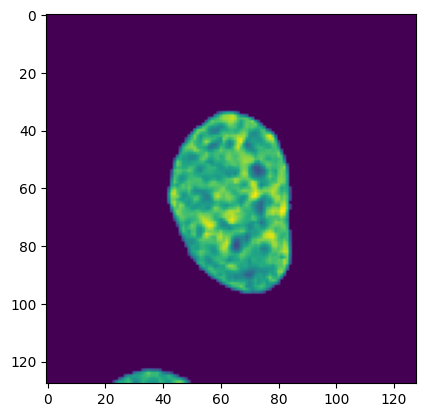

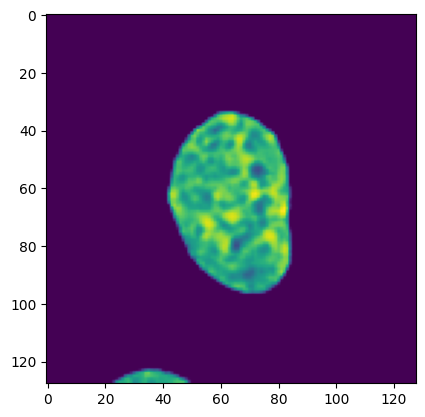

4


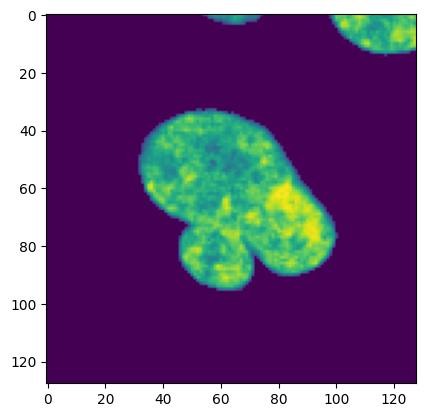

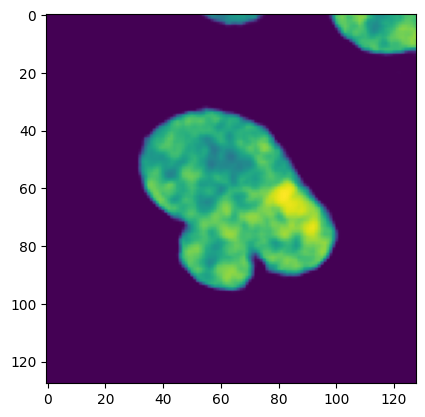

5


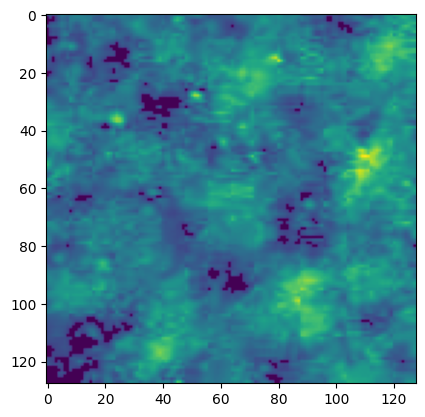

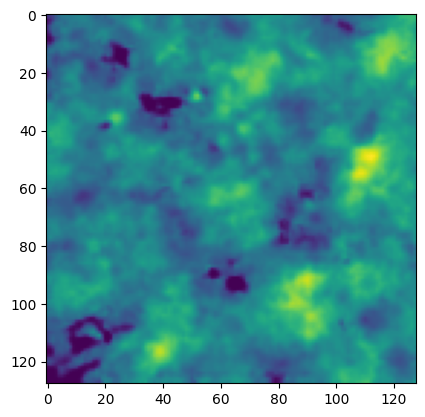

6


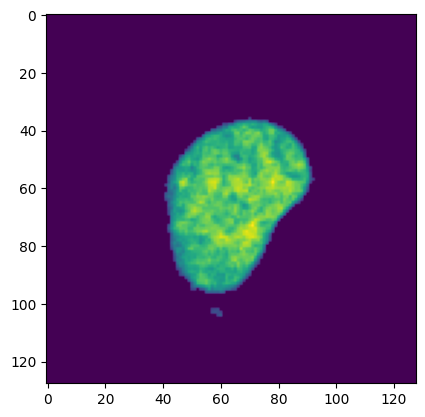

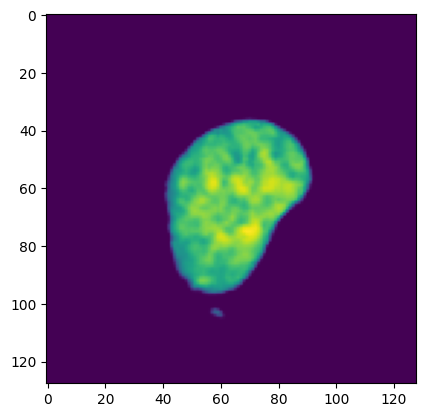

7


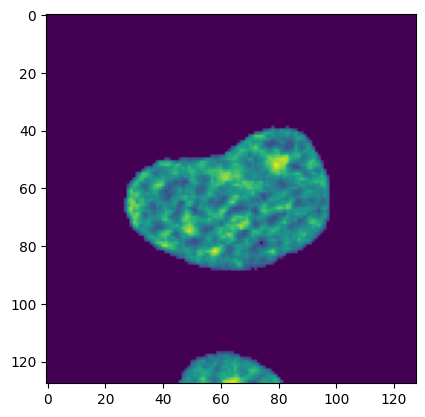

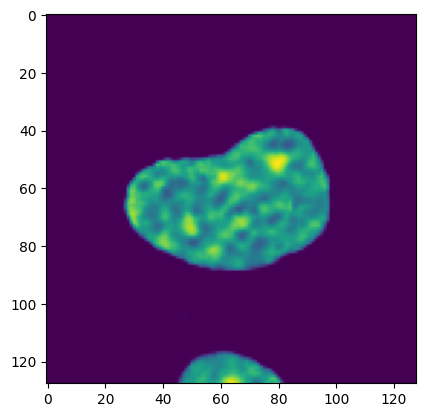

8


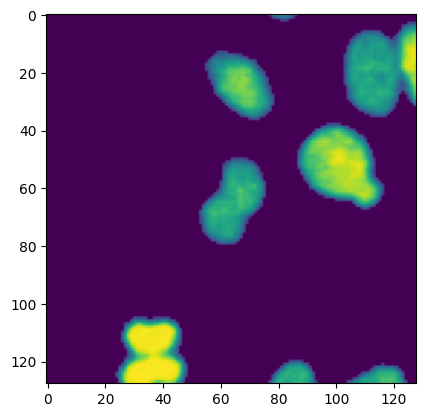

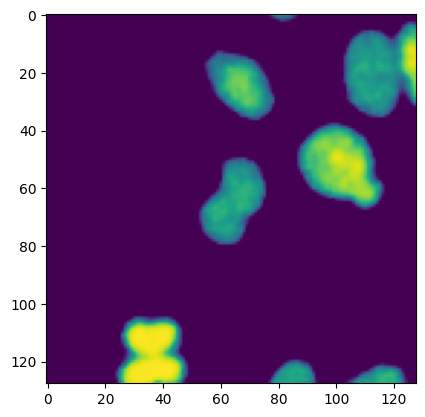

9


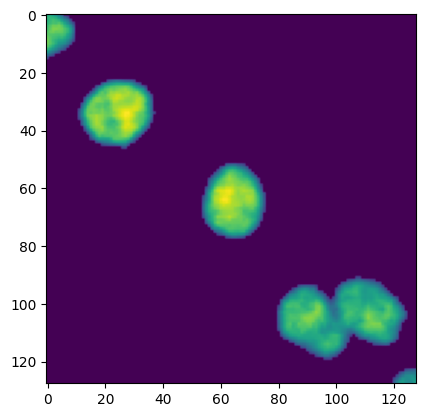

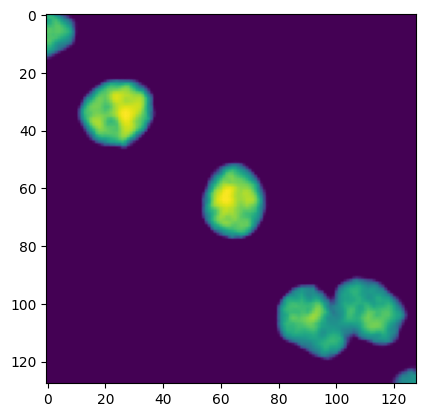

10


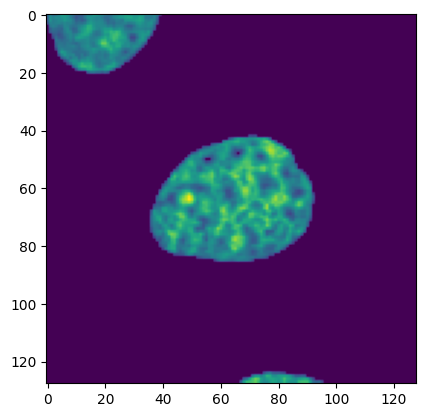

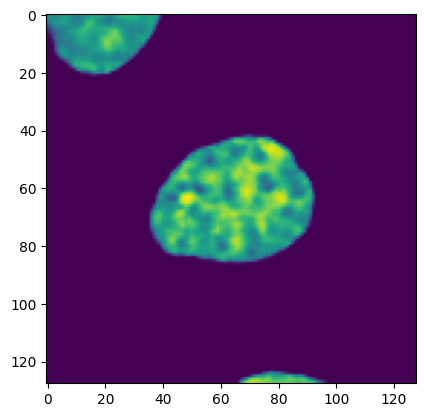

11


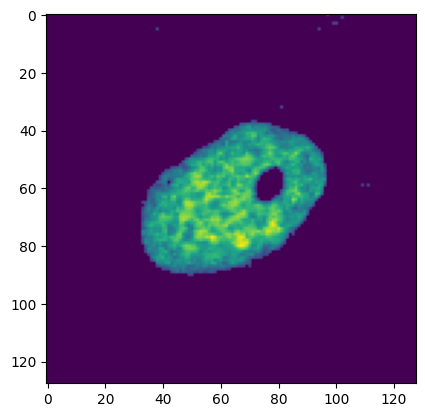

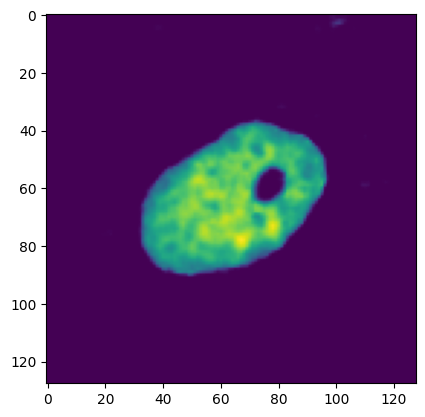

12


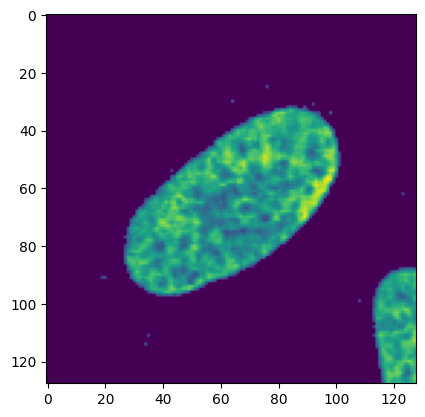

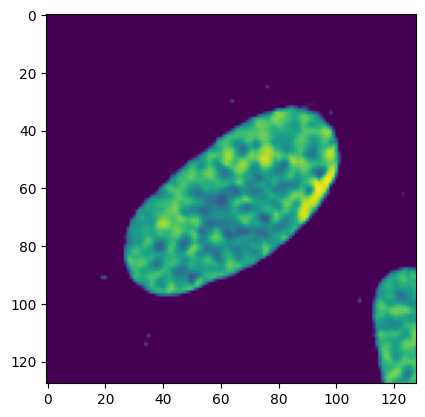

13


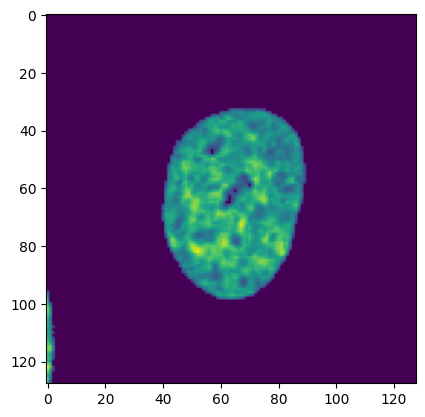

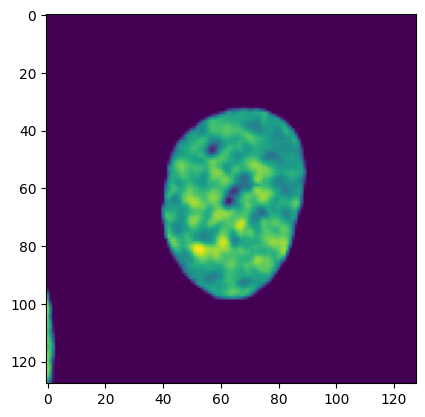

14


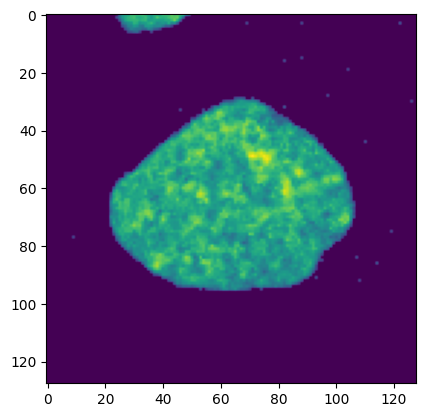

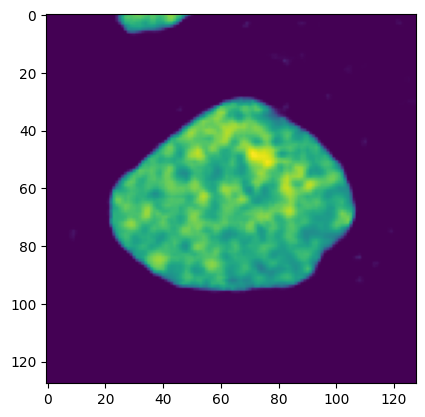

15


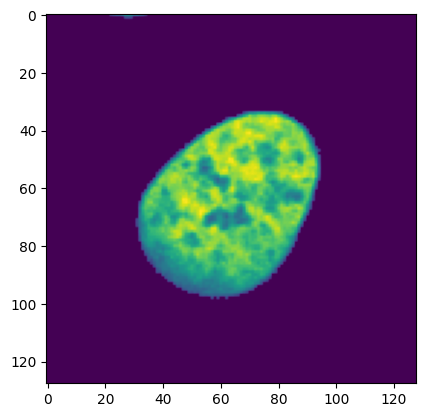

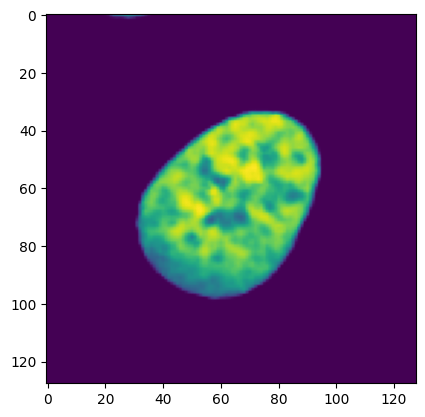

16


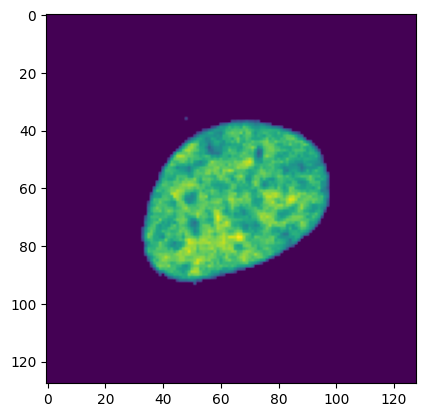

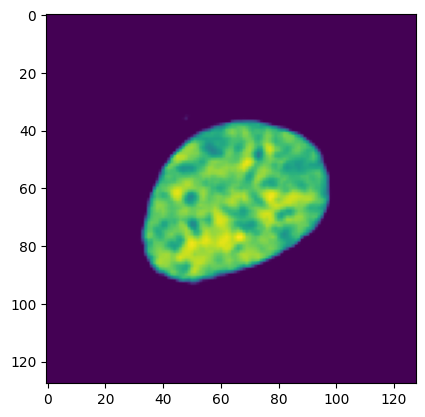

17


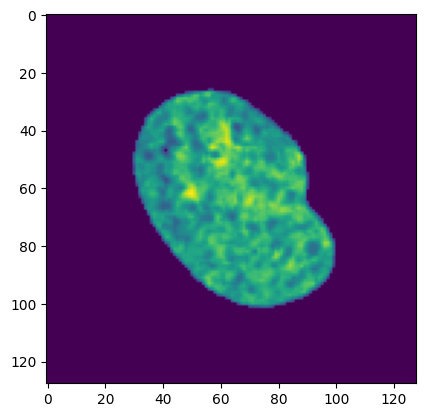

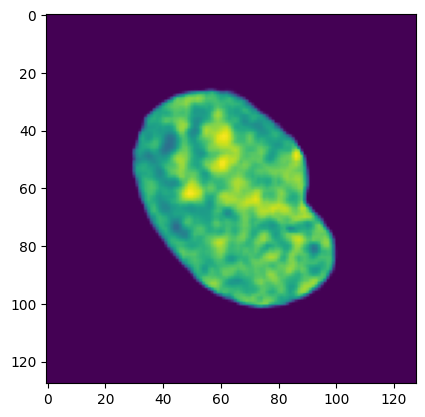

18


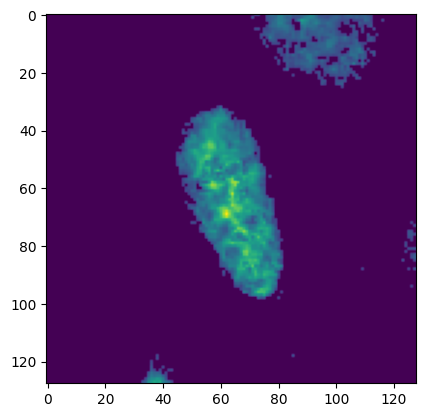

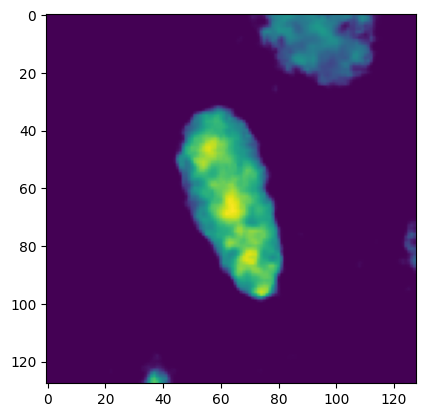

19


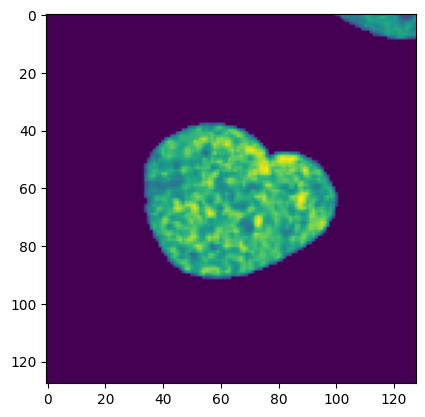

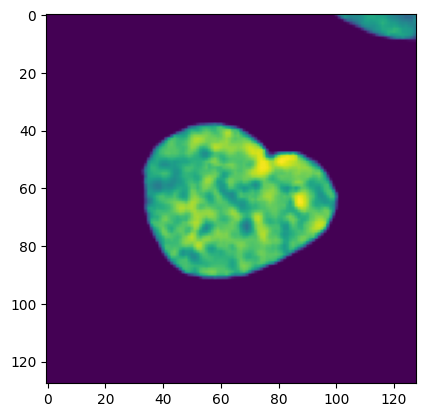

In [38]:
for i in range(20):
    print(i)
    plt.imshow(sigmoid(traintarget_dna[i][0]).cpu().detach().numpy())
    plt.show()
    plt.imshow(sigmoid(recon_dna[i][0]).cpu().detach().numpy())
    plt.show()

In [21]:
with open(os.path.join('/mnt/d2/xinyi/c2p/hpa/plots/',modelname_train,'nucProp_u2os'), 'rb') as output:
    allNucProp=pickle.load(output)
cellIDbyCellLine_pNamesFiltered_comb=np.concatenate((cellIDbyCellLine_pNamesFiltered,cellIDbyCellLine_new_pNamesFiltered))
allNucProp_byProtein=np.zeros(cellIDbyCellLine_pNamesUniqueFiltered.size)
for pidx in range(cellIDbyCellLine_pNamesUniqueFiltered.size):
    p=cellIDbyCellLine_pNamesUniqueFiltered[pidx]
    pidx_cell=cellIDbyCellLine_pNamesFiltered_comb==p
    allNucProp_byProtein[pidx]=np.std(allNucProp[pidx_cell])
allNucProp_stdRank=np.argsort(-allNucProp_byProtein)
allNucProp_stdRank

array([  6,  80,   7, 137, 129,   3, 125,   4,  95,  12,  93,   0,  91,
        47,  73,  11,  32, 119,   5, 128,  76, 108,  96,  65,  20,  37,
        14,  53,  69,  43,  90,  56,  27,  33,  26,  45,  61,  55, 112,
        16,  39, 136,  94,  21,  42,  85, 123,  31,  40,  68, 139,  92,
       105,  41,  22,  36,  19, 140,  84,  52, 103, 102,  78,  58,  83,
       131,  75,  29,  70,  66,  38, 130,  13,  74,  79, 126,  86,  10,
        15, 100,  54, 114, 135, 138,   1,  46, 111,   8,  34,  24,  18,
       132,  28,  81,  87,  49, 104, 127,  62, 120,  97,  98,  77,  72,
        82,  88,  67, 121,  60, 124, 133,  64, 107,  89,  44,  63,   9,
       101, 117,  48,  57,  35,  30,  59, 110,  25, 116, 134,  23,  99,
        17,  51, 122, 109, 118, 106,   2, 113,  50,  71, 115])

ABCB8


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='d

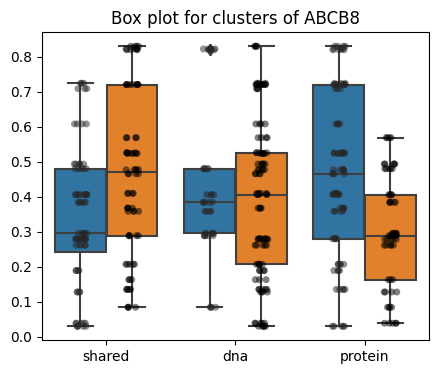

Two-sided p-value for latent_shared_dec clusters: 0.0004755923674889951
Two-sided p-value for latent_dna_dec clusters: 0.5851291933222635
Two-sided p-value for latent_protein_dec clusters: 3.925526153716237e-06
CPSF6


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='d

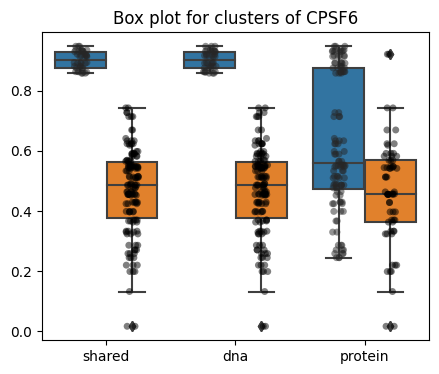

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 3.461493428429262e-45
Two-sided p-value for latent_dna_dec clusters: 3.461493428429262e-45
Two-sided p-value for latent_protein_dec clusters: 1.544914199031783e-06
ABCC8


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


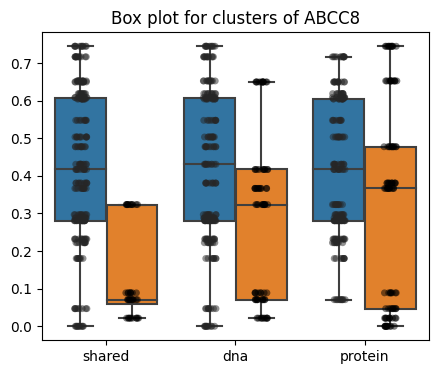

Two-sided p-value for latent_shared_dec clusters: 1.9583734226607824e-16
Two-sided p-value for latent_dna_dec clusters: 3.717489846418591e-05
Two-sided p-value for latent_protein_dec clusters: 0.0038213207501380697
FTSJ3


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='d

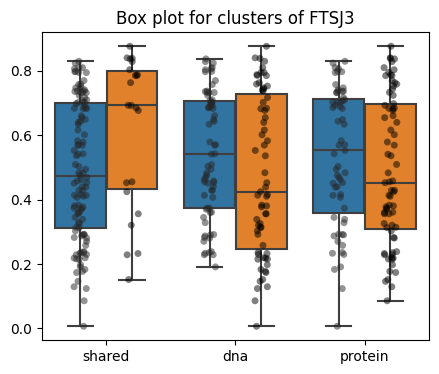

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.014257683702965556
Two-sided p-value for latent_dna_dec clusters: 0.0875948334968389
Two-sided p-value for latent_protein_dec clusters: 0.2721116878551864
FAM131A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


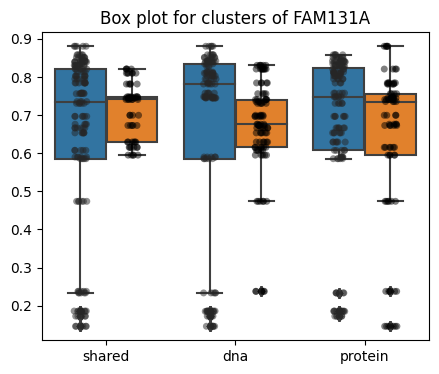

Two-sided p-value for latent_shared_dec clusters: 0.010419960719740514
Two-sided p-value for latent_dna_dec clusters: 0.5246754419175124
Two-sided p-value for latent_protein_dec clusters: 0.3579431325563084
AASS


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='d

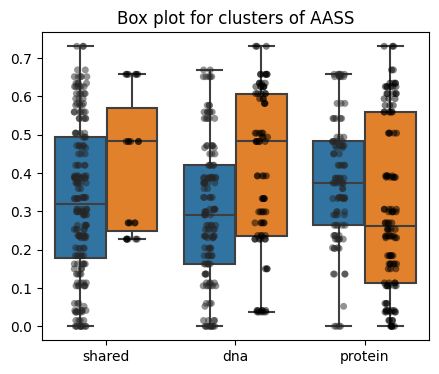

Two-sided p-value for latent_shared_dec clusters: 0.05038359865110004
Two-sided p-value for latent_dna_dec clusters: 2.3187625321208487e-05
Two-sided p-value for latent_protein_dec clusters: 0.009710889102567453
ETFA


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='d

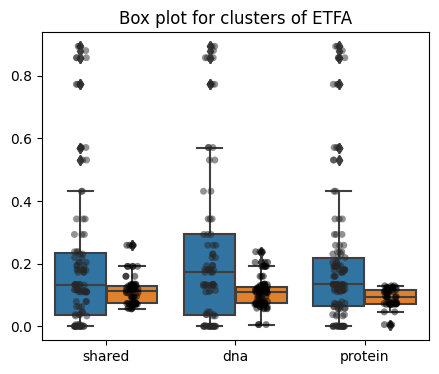

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.0011354046526554425
Two-sided p-value for latent_dna_dec clusters: 8.471369978339654e-06
Two-sided p-value for latent_protein_dec clusters: 0.0004329666358358845
ABAT


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


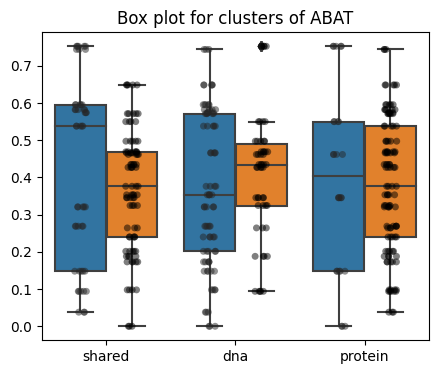

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.11670178746760927
Two-sided p-value for latent_dna_dec clusters: 0.2777808524619606
Two-sided p-value for latent_protein_dec clusters: 0.7609622279202531
DDX21


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


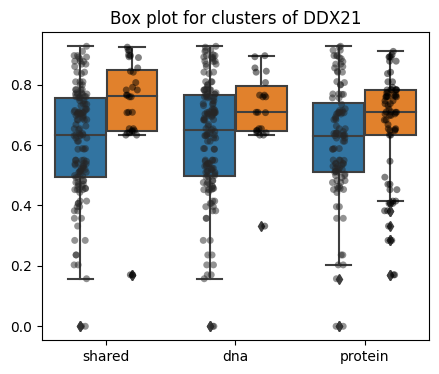

Two-sided p-value for latent_shared_dec clusters: 0.0012295095423727272
Two-sided p-value for latent_dna_dec clusters: 0.02367770848080274
Two-sided p-value for latent_protein_dec clusters: 0.08222226016486436
ADCY5


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='d

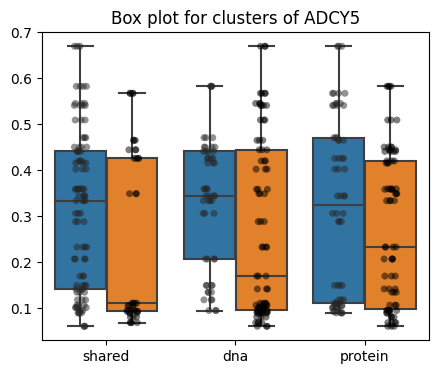

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.033796143799322366
Two-sided p-value for latent_dna_dec clusters: 0.04970316196787282
Two-sided p-value for latent_protein_dec clusters: 0.12977088609203413
DDX1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


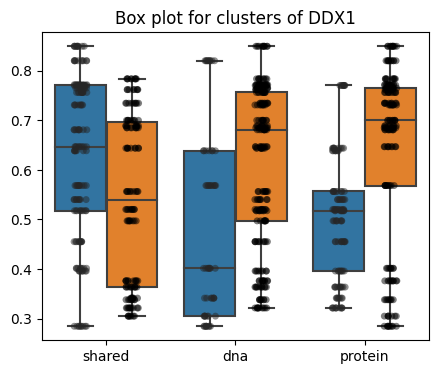

Two-sided p-value for latent_shared_dec clusters: 4.148152422390798e-06
Two-sided p-value for latent_dna_dec clusters: 3.211403984722591e-06
Two-sided p-value for latent_protein_dec clusters: 1.9090052473294214e-12
A1CF


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='d

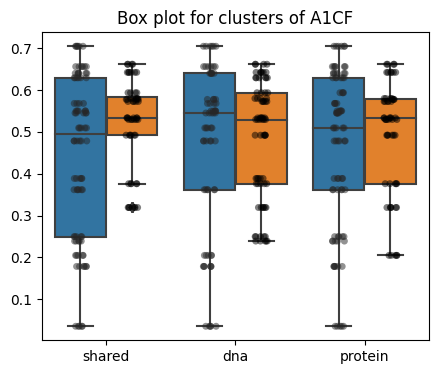

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.0026856685346704177
Two-sided p-value for latent_dna_dec clusters: 0.4556913153357047
Two-sided p-value for latent_protein_dec clusters: 0.2555100405461288
DDB1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


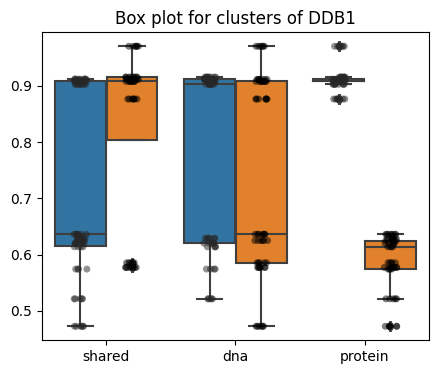

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.0003125023415537641
Two-sided p-value for latent_dna_dec clusters: 0.09951305803406846
Two-sided p-value for latent_protein_dec clusters: 9.362914818586676e-79
C8orf59


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


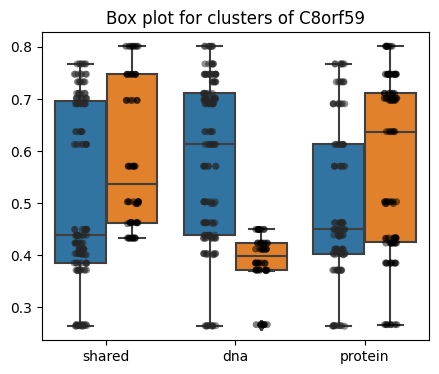

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.002317704520540065
Two-sided p-value for latent_dna_dec clusters: 1.4217124467974715e-16
Two-sided p-value for latent_protein_dec clusters: 0.00019277865894871707
CIZ1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


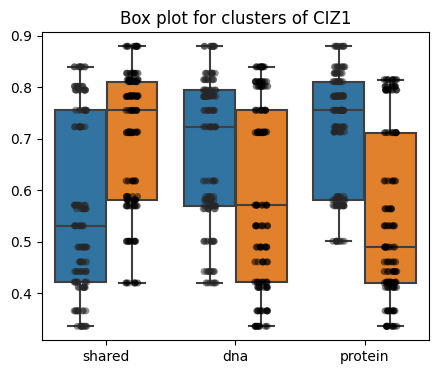

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 1.1472818600600479e-11
Two-sided p-value for latent_dna_dec clusters: 2.0289696905229487e-05
Two-sided p-value for latent_protein_dec clusters: 4.144871314837307e-20
ADAR


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


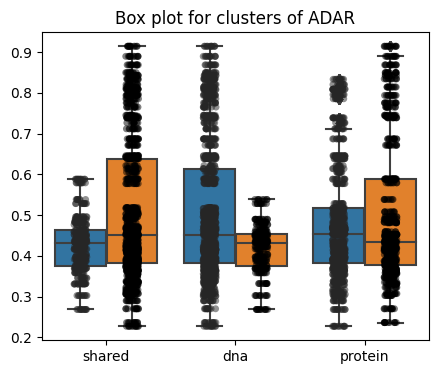

Two-sided p-value for latent_shared_dec clusters: 8.99075552530094e-19
Two-sided p-value for latent_dna_dec clusters: 2.8508419227584516e-18
Two-sided p-value for latent_protein_dec clusters: 0.005671750262003075
ATE1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='d

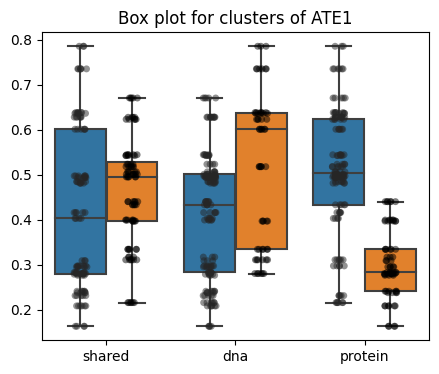

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.04289145541912928
Two-sided p-value for latent_dna_dec clusters: 1.726634817240627e-06
Two-sided p-value for latent_protein_dec clusters: 6.4273434849398315e-25
ELAC2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


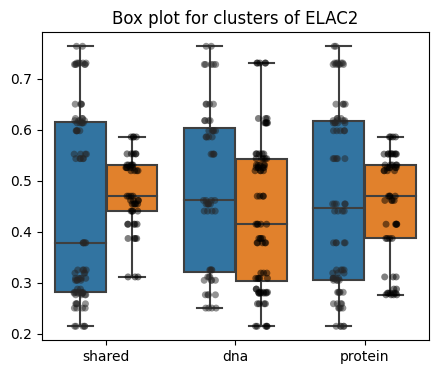

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.28660279499727714
Two-sided p-value for latent_dna_dec clusters: 0.05744856550411641
Two-sided p-value for latent_protein_dec clusters: 0.5336449152362919
ABCB7


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


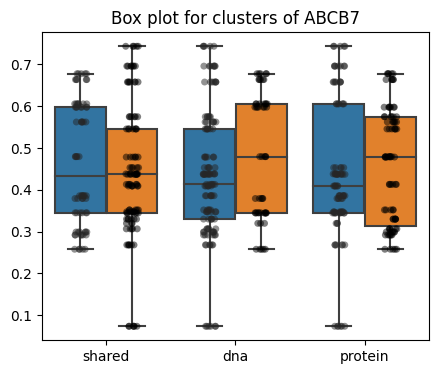

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.3163403062060683
Two-sided p-value for latent_dna_dec clusters: 0.07198688168814704
Two-sided p-value for latent_protein_dec clusters: 0.428115096132456
FAM111A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


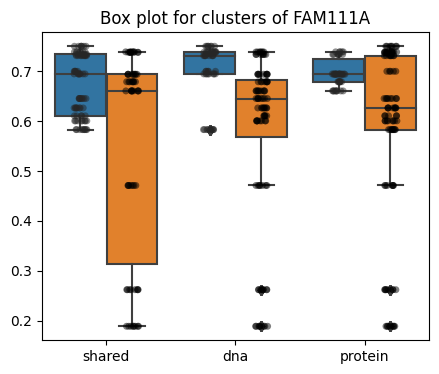

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 2.0220365555929726e-06
Two-sided p-value for latent_dna_dec clusters: 2.2866016034550988e-06
Two-sided p-value for latent_protein_dec clusters: 3.015660680574628e-05
CLNS1A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


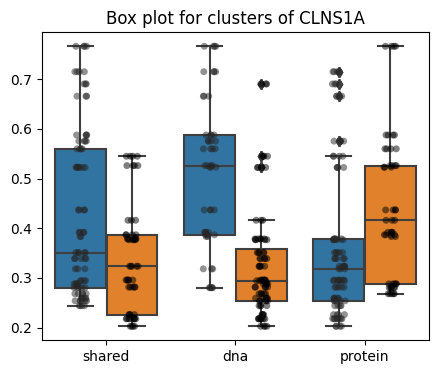

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.0004184743404807105
Two-sided p-value for latent_dna_dec clusters: 2.2649247863333612e-14
Two-sided p-value for latent_protein_dec clusters: 0.0053231093218273455
EARS2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


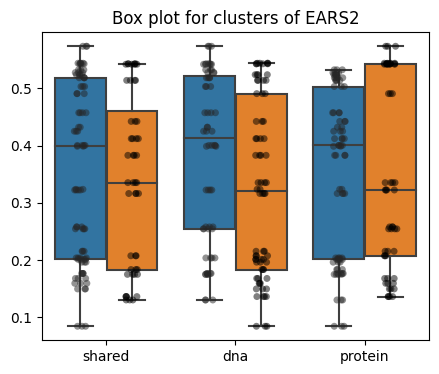

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.5965880085792665
Two-sided p-value for latent_dna_dec clusters: 0.02491757871614133
Two-sided p-value for latent_protein_dec clusters: 0.8091755338477467
DDX39B


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


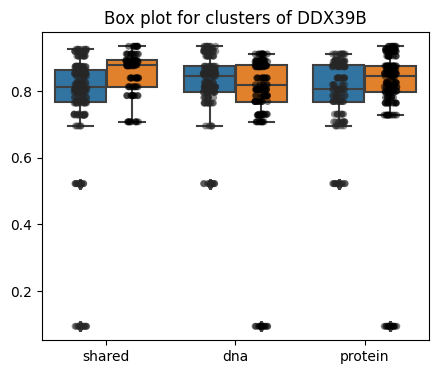

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 9.573454175659583e-06
Two-sided p-value for latent_dna_dec clusters: 0.0019637102480104273
Two-sided p-value for latent_protein_dec clusters: 0.883392161632511
CHAMP1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


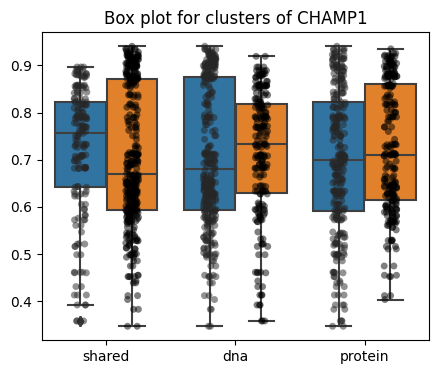

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Two-sided p-value for latent_shared_dec clusters: 0.33146688204856845
Two-sided p-value for latent_dna_dec clusters: 0.7276020001378842
Two-sided p-value for latent_protein_dec clusters: 0.036131374493220965
ALG2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


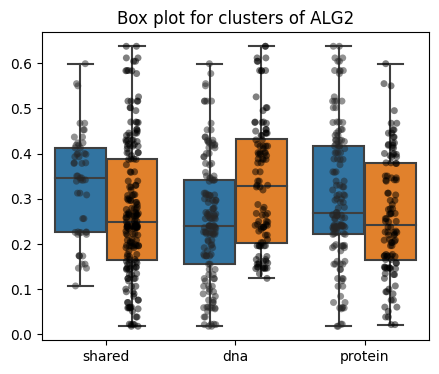

Two-sided p-value for latent_shared_dec clusters: 0.007855032930504574
Two-sided p-value for latent_dna_dec clusters: 1.0359492450846686e-05
Two-sided p-value for latent_protein_dec clusters: 0.016655565045606432


In [45]:
from sklearn.cluster import KMeans
from scipy.stats import ttest_ind

for pidx in range(25):
    p = cellIDbyCellLine_pNamesUniqueFiltered[allNucProp_stdRank[pidx]]
    print(p)

    # Prepare data for latent_shared_dec
    latent_shared = latent_shared_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_shared = KMeans(n_clusters=2, random_state=0).fit(latent_shared)
    labels_shared = kmeans_shared.labels_
    data_shared = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]

    # Prepare data for latent_dna_dec
    latent_dna = latent_dna_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_dna = KMeans(n_clusters=2, random_state=0).fit(latent_dna)
    labels_dna = kmeans_dna.labels_
    data_dna = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]

    # Prepare data for latent_protein_dec
    latent_protein = latent_protein_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_protein = KMeans(n_clusters=2, random_state=0).fit(latent_protein)
    labels_protein = kmeans_protein.labels_
    data_protein = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]

    # Combine data
    data_combined = np.concatenate([data_shared, data_dna, data_protein])
    labels_combined = np.concatenate([labels_shared, labels_dna, labels_protein])
    latent_names = np.array(['shared'] * len(data_shared) + ['dna'] * len(data_dna) + ['protein'] * len(data_protein))

    # Box plot with data points
    plt.figure(figsize=(5, 4))
    sns.boxplot(x=latent_names, y=data_combined, hue=labels_combined)
    sns.stripplot(x=latent_names, y=data_combined, hue=labels_combined, dodge=True, jitter=True, color='black', alpha=0.5)
    plt.title(f'Box plot for clusters of {p}')
    plt.legend([],[], frameon=False) # Remove legend created by stripplot
    plt.show()

    # Compute two-sided p-value
    group1_shared = data_shared[labels_shared == 0]
    group2_shared = data_shared[labels_shared == 1]
    t_stat_shared, p_val_shared = ttest_ind(group1_shared, group2_shared)
    print(f"Two-sided p-value for latent_shared_dec clusters: {p_val_shared}")

    group1_dna = data_dna[labels_dna == 0]
    group2_dna = data_dna[labels_dna == 1]
    t_stat_dna, p_val_dna = ttest_ind(group1_dna, group2_dna)
    print(f"Two-sided p-value for latent_dna_dec clusters: {p_val_dna}")

    group1_protein = data_protein[labels_protein == 0]
    group2_protein = data_protein[labels_protein == 1]
    t_stat_protein, p_val_protein = ttest_ind(group1_protein, group2_protein)
    print(f"Two-sided p-value for latent_protein_dec clusters: {p_val_protein}")

In [72]:
exampleSavePath=os.path.join(plotsavepath_train,'nucProp_clusterExamples_withProtein')
nExamples=20
imgSize=128
for pidx in range(25):
    p = cellIDbyCellLine_pNamesUniqueFiltered[allNucProp_stdRank[pidx]]
    print(p)
    
    # Prepare data for latent_shared_dec
    latent_shared = latent_shared_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_shared = KMeans(n_clusters=2, random_state=0).fit(latent_shared)
    labels_shared = kmeans_shared.labels_
    data_shared = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_shared==0]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],0]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_shared_0.jpg'),plotExample)
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_shared==1]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],0]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_shared_1.jpg'),plotExample)

    # Prepare data for latent_dna_dec
    latent_dna = latent_dna_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_dna = KMeans(n_clusters=2, random_state=0).fit(latent_dna)
    labels_dna = kmeans_dna.labels_
    data_dna = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_dna==0]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],0]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_dna_0.jpg'),plotExample)
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_dna==1]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],0]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_dna_1.jpg'),plotExample)

    # Prepare data for latent_protein_dec
    latent_protein = latent_protein_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    kmeans_protein = KMeans(n_clusters=2, random_state=0).fit(latent_protein)
    labels_protein = kmeans_protein.labels_
    data_protein = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_protein==0]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],0]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_protein_0.jpg'),plotExample)
    plotExample=np.zeros((nExamples*(imgSize+2),3*(imgSize+2)))
    imgIdx=np.arange(allImages.shape[0])[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p][labels_protein==1]
    np.random.seed(3)
    np.random.shuffle(imgIdx)
    plotIdx=imgIdx[:min(imgIdx.size,nExamples)]
    print('sampled')
    for plotIdx_idx in range(plotIdx.size):
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,:imgSize]=allImages[plotIdx[plotIdx_idx],0]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2):(imgSize+2)+imgSize]=allImages[plotIdx[plotIdx_idx],2]
        plotExample[plotIdx_idx*(imgSize+2):plotIdx_idx*(imgSize+2)+imgSize,(imgSize+2)*2:(imgSize+2)*2+imgSize]=allProteinImages[plotIdx[plotIdx_idx]]
    plt.imsave(os.path.join(exampleSavePath,p+'_protein_1.jpg'),plotExample)



ABCB8


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
CPSF6


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ABCC8


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
FTSJ3


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
FAM131A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
AASS


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ETFA


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ABAT


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
DDX21


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ADCY5


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
DDX1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
A1CF


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
DDB1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
C8orf59


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
CIZ1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ADAR


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ATE1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ELAC2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ABCB7


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
FAM111A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
CLNS1A


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
EARS2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
DDX39B


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
CHAMP1


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled
ALG2


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


sampled
sampled


In [ ]:
from sklearn.cluster import KMeans
from scipy.stats import ttest_ind

# Define the number of clusters and random states
n_runs = 5
nsig=4
num_latents = 3
num_proteins = 25
abs_diff_means = np.zeros((num_proteins, num_latents))
significant_entries = np.zeros((num_proteins, num_latents), dtype=int)
diff_thresh=0.1

bonferroni_threshold = 0.05 / (num_proteins * num_latents)/3

for pidx in range(25):
    p = cellIDbyCellLine_pNamesUniqueFiltered[allNucProp_stdRank[pidx]]
    print(p)

    # Prepare data for each latent
    latent_data = {
        'shared': latent_shared_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy(),
        'dna': latent_dna_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy(),
        'protein': latent_protein_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    }

    for latent_name, latent in latent_data.items():
        all_abs_diff_means = []
        all_significant_entries = []

        for run in range(n_runs):
            kmeans = KMeans(n_clusters=2, random_state=run).fit(latent)
            labels = kmeans.labels_
            data = allNucProp[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p]

            group1 = data[labels == 0]
            group2 = data[labels == 1]
            abs_diff_mean = np.abs(np.mean(group1) - np.mean(group2))
            all_abs_diff_means.append(abs_diff_mean)

            _, p_val = ttest_ind(group1, group2)
            significant = p_val < bonferroni_threshold
            all_significant_entries.append(significant)

        # Average the absolute differences
        avg_abs_diff_means = np.mean(all_abs_diff_means)
        abs_diff_means[pidx, {'shared': 0, 'dna': 1, 'protein': 2}[latent_name]] = avg_abs_diff_means

        # Determine if there was any significant result across all runs
        sigDiff=np.array(all_abs_diff_means)>diff_thresh
        significant_entries[pidx, {'shared': 0, 'dna': 1, 'protein': 2}[latent_name]] = np.sum(np.logical_and(all_significant_entries,sigDiff))


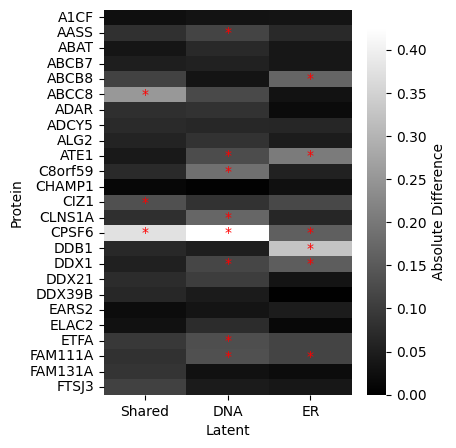

In [24]:
filtered_significant_entries = significant_entries>nsig
filtered_proteins = [cellIDbyCellLine_pNamesUniqueFiltered[allNucProp_stdRank[i]] for i in range(25)]

filtered_proteins_array = np.array(filtered_proteins)

# Sort abs_diff_means and filtered_proteins by protein names (row names) alphabetically
sorted_indices = np.argsort(filtered_proteins_array)
abs_diff_means = abs_diff_means[sorted_indices, :]
filtered_proteins_sorted = filtered_proteins_array[sorted_indices]
filtered_significant_entries = filtered_significant_entries[sorted_indices, :]

# Plotting the heatmap
plt.figure(figsize=(4, 5))
sns.heatmap(abs_diff_means, cmap='gray', cbar_kws={'label': 'Absolute Difference', 'extend': 'max'}, vmin=0, vmax=0.425)

# Adding red asterisks for significant entries
for i in range(abs_diff_means.shape[0]):
    for j in range(abs_diff_means.shape[1]):
        if filtered_significant_entries[i, j]:
            plt.text(j + 0.5, i + 0.5, '*', color='red', ha='center', va='center')

# Labeling axes
plt.xlabel('Latent')
plt.ylabel('Protein')

# Customize x-ticks and y-ticks
plt.xticks(ticks=np.arange(abs_diff_means.shape[1]) + 0.5, labels=['Shared', 'DNA', 'ER'])
plt.yticks(ticks=np.arange(abs_diff_means.shape[0]) + 0.5, labels=filtered_proteins_sorted, rotation=0)

# Save the figure with tight bounding box
plt.savefig(os.path.join(plotsavepath_train, 'nucProp_clusterDiff_top25_filtered_5runs_allprots_ordered.pdf'), bbox_inches='tight')

# Show the plot
plt.show()

/home/xinyi/anaconda3/envs/subcell_loc2/lib/python3.9/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)
/tmp/ipykernel_35799/1615975719.py:81: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  t_stat, p_val = ttest_ind(group1, group2)


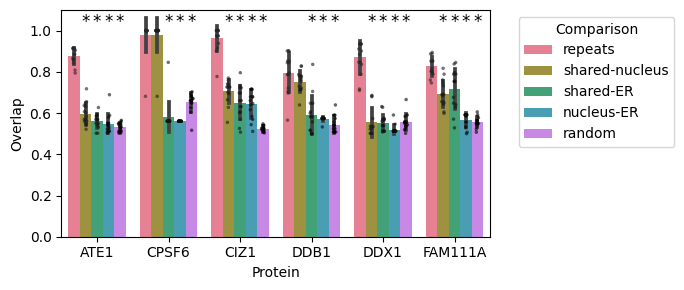

In [85]:
# Define the number of clusters and random states
n_runs = 15
num_proteins = 25
p2plot=['ATE1','CPSF6','CIZ1','DDB1','DDX1','FAM111A']
overlapRes={}

bonferroni_threshold = 0.05 / (num_proteins * num_latents)/2

compnames=['repeats','shared-nucleus','shared-ER','nucleus-ER','random']
for pidx in range(len(p2plot)):
    p = p2plot[pidx]
    print(p)
    
    # Prepare data for each latent
    latent_shared=latent_shared_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    latent_dna=latent_dna_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()
    latent_protein=latent_protein_dec.weight[trainIdx_all][cellIDbyCellLine_pNamesFiltered_comb[trainIdx_all] == p].detach().numpy()

    overlapRes[p]=np.zeros((n_runs,5))
    kmeans = KMeans(n_clusters=2, random_state=100).fit(latent_shared)
    labels_shared_0 = kmeans.labels_
    for run in range(n_runs):
        kmeans = KMeans(n_clusters=2, random_state=run).fit(latent_shared)
        labels_shared = kmeans.labels_
        
        kmeans = KMeans(n_clusters=2, random_state=run).fit(latent_dna)
        labels_dna = kmeans.labels_
        
        kmeans = KMeans(n_clusters=2, random_state=run).fit(latent_protein)
        labels_protein = kmeans.labels_
        
        overlapRes[p][run,0]=max(np.sum(labels_shared_0==labels_shared),np.sum(labels_shared_0!=labels_shared))/labels_shared.size
        overlapRes[p][run,1]=max(np.sum(labels_dna==labels_shared),np.sum(labels_dna!=labels_shared))/labels_shared.size
        overlapRes[p][run,2]=max(np.sum(labels_protein==labels_shared),np.sum(labels_protein!=labels_shared))/labels_shared.size
        overlapRes[p][run,3]=max(np.sum(labels_dna==labels_protein),np.sum(labels_dna!=labels_protein))/labels_shared.size
        np.random.seed(run)
        labels_shared_random=np.copy(labels_shared)
        labels_shared_random1=np.copy(labels_shared)
        np.random.shuffle(labels_shared_random)
        np.random.seed(run+1)
        np.random.shuffle(labels_shared_random1)
        overlapRes[p][run,4]=max(np.sum(labels_shared_random==labels_shared_random1),np.sum(labels_shared_random!=labels_shared_random1))/labels_shared.size


results = []
for p in p2plot:
    for run in range(n_runs):
        for i, compname in enumerate(compnames):
            results.append({
                'Protein': p,
                'Comparison': compname,
                'Overlap': overlapRes[p][run, i]
            })

# Convert the list of results into a DataFrame
df = pd.DataFrame(results)

# Set the bar plot with error bars
plt.figure(figsize=(7, 3))
barplot = sns.barplot(x='Protein', y='Overlap', hue='Comparison', data=df, errorbar='sd', palette='husl', dodge=True)

# Overlay individual data points without legend
sns.stripplot(x='Protein', y='Overlap', hue='Comparison', data=df, 
              jitter=True, dodge=True, marker='.', color='black', alpha=0.6, legend=False)

# Calculate and annotate asterisks for significant p-values separately for each protein
for p in p2plot:
    df_p = df[df['Protein'] == p]
    y_max = df_p['Overlap'].max()
    
    # Get the positions of the bars
    bars = barplot.patches
    
    # Iterate over comparisons except "repeats"
    for comp_idx, comp in enumerate(compnames[1:], start=1):
        
        group1 = df_p[df_p['Comparison'] == 'repeats']['Overlap']
        group2 = df_p[df_p['Comparison'] == comp]['Overlap']

        # Perform t-test
        t_stat, p_val = ttest_ind(group1, group2)

        # Bonferroni correction for multiple comparisons
        p_val_corrected = min(p_val * (len(compnames) - 1), 1.0)

        # Determine if the p-value is significant
        if p_val_corrected < 0.05:
            # Calculate x-position and y-position for the asterisk
            x_pos = bars[p2plot.index(p)+comp_idx*6].get_x() + bars[p2plot.index(p)+comp_idx*6].get_width() / 2
            y_pos = bars[comp_idx].get_height() + 0.4

#             print(comp_idx, comp, x_pos, y_max)
            # Annotate with an asterisk above the bar
            plt.text(x_pos, 1, '*', ha='center', va='bottom', color='k', fontsize=12)

# Adjusting the plot
plt.ylim(0, df['Overlap'].max() + 0.1)  # Increase the y-limit to make space for asterisks
plt.ylabel('Overlap')
# plt.title('Overlap Across Latent Spaces for Selected Proteins')
plt.legend(title='Comparison', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.savefig(os.path.join(plotsavepath_train,'nucProp_clusterOverlap.pdf'), bbox_inches='tight')

# Show the plot
plt.show()

